In [1]:
#load neccesary packages
using Eirene
using CSV
using DataFrames
using Plots
using RCall
using Combinatorics
using Statistics
using StatsPlots
using RDatasets
using HypothesisTests
using StatsBase
using VegaLite
using StatsPlots

R"library(TDA)"
#R"source('C://Users//Tupperware93//Documents//bottleneckCalculator.R')"

┌ Info: Recompiling stale cache file C:\Users\93tup\.julia\compiled\v1.1\Eirene\mCiG1.ji for Eirene [9c0f25c4-2ca1-5870-89f6-52640788da1d]
└ @ Base loading.jl:1184
┌ Warning: Package Eirene does not have Pkg in its dependencies:
│ - If you have Eirene checked out for development and have
│   added Pkg as a dependency but haven't updated your primary
│   environment's manifest file, try `Pkg.resolve()`.
│ - Otherwise you may need to report an issue with Eirene
└ Loading Pkg into Eirene from project dependency, future warnings for Eirene are suppressed.


HTML{String}("<script>\n// Immediately-invoked-function-expression to avoid global variables.\n(function() {\n    var warning_div = document.getElementById(\"webio-warning-2507988759697320870\");\n    var hide = function () {\n        var script = document.getElementById(\"webio-setup-13438349199632793210\");\n        var parent = script && script.parentElement;\n        var grandparent = parent && parent.parentElement;\n        if (grandparent) {\n            grandparent.style.display = \"none\";\n        }\n        warning_div.style.display = \"none\";\n    };\n    if (typeof Jupyter !== \"undefined\") {\n        console.log(\"WebIO detected Jupyter notebook environment.\");\n        // Jupyter notebook.\n        var extensions = (\n            Jupyter\n            && Jupyter.notebook.config.data\n            && Jupyter.notebook.config.data.load_extensions\n        );\n        if (extensions && extensions[\"webio-jupyter-notebook\"]) {\n            // Extension already loaded.\n            console.log(\"Jupyter WebIO nbextension detected; not loading ad-hoc.\");\n            hide();\n            return;\n        }\n    } else if (window.location.pathname.includes(\"/lab\")) {\n        // Guessing JupyterLa\n        console.log(\"Jupyter Lab detected; make sure the @webio/jupyter-lab-provider labextension is installed.\");\n        hide();\n        return;\n    }\n})();\n\n</script>\n<p\n    id=\"webio-warning-2507988759697320870\"\n    class=\"output_text output_stderr\"\n    style=\"padding: 1em; font-weight: bold;\"\n>\n    Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n    For troubleshooting, please see <a href=\"https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/\">\n    the WebIO/IJulia documentation</a>.\n    <!-- TODO: link to installation docs. -->\n</p>\n")

┌ Info: Recompiling stale cache file C:\Users\93tup\.julia\compiled\v1.1\Plots\ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1184
┌ Info: Recompiling stale cache file C:\Users\93tup\.julia\compiled\v1.1\RCall\8GFyb.ji for RCall [6f49c342-dc21-5d91-9882-a32aef131414]
└ @ Base loading.jl:1184



R version 3.6.0 (2019-04-26) -- "Planting of a Tree"
Copyright (C) 2019 The R Foundation for Statistical Computing
Platform: x86_64-w64-mingw32/x64 (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.



┌ Info: Recompiling stale cache file C:\Users\93tup\.julia\compiled\v1.1\StatsPlots\SiylL.ji for StatsPlots [f3b207a7-027a-5e70-b257-86293d7955fd]
└ @ Base loading.jl:1184
┌ Info: Recompiling stale cache file C:\Users\93tup\.julia\compiled\v1.1\RDatasets\JyIbx.ji for RDatasets [ce6b1742-4840-55fa-b093-852dadbb1d8b]
└ @ Base loading.jl:1184
┌ Info: Recompiling stale cache file C:\Users\93tup\.julia\compiled\v1.1\HypothesisTests\MUGEl.ji for HypothesisTests [09f84164-cd44-5f33-b23f-e6b0d136a0d5]
└ @ Base loading.jl:1184


RObject{StrSxp}
[1] "TDA"       "stats"     "graphics"  "grDevices" "utils"     "datasets" 
[7] "methods"   "base"     


In [2]:
#load neccesary data files
positions = CSV.read("C://Users//93tup//Downloads//From Gene Expression File//279positions.csv", copycols = true, header = false)
positionsLabels = CSV.read("C://Users//93tup//Downloads//From Gene Expression File//279positionsLabels.csv", copycols = true, header = false)
birthTimes = CSV.read("C://Users//93tup//Downloads//From Gene Expression File//279birthTimes.csv", copycols = true, header = false)
birthTimesLabels = CSV.read("C://Users//93tup//Downloads//From Gene Expression File//279birthTimesLabels.csv", copycols = true, header = false)
connectionList = CSV.read("C://Users//93tup//Downloads//From Gene Expression File//NeuronConnect_corrected.csv", copycols = true, header = false)
labeledTypeList = CSV.read("C://Users//93tup//Downloads//From Gene Expression File//279labeledTypes.csv", copycols = true, header = false)
oneDimTopSim = CSV.read("C://Users//Tupperware93//Downloads//From Gene Expression File//mostCurrentOneDimensionalSimilarity.csv", copycols = true, header = false)
twoDimTopSim = CSV.read("C://Users//Tupperware93//Downloads//From Gene Expression File//mostCurrentTwoDimensionalSimilarity.csv", copycols = true, header = false)


#done
println("done")

done


In [3]:
#process all the data into a single array sorted by birth time

#creates an array for positions with their labels
positionsMatrix = Array{Any, 2}(UndefInitializer(),279,3)

for i in 1:279
    positionsMatrix[i,1] = positionsLabels[1][i]
    positionsMatrix[i,2] = positions[i,1]
    positionsMatrix[i,3] = positions[i,2]
end

#creates an array for positions with their labels
birthTimesMatrix = Array{Any, 2}(UndefInitializer(),279,2)

for i in 1:279
    birthTimesMatrix[i,1] = birthTimesLabels[1][i]
    birthTimesMatrix[i,2] = birthTimes[1][i]
end

#creates an array for types with their labels
typeMatrix = Array{Any, 2}(UndefInitializer(), 279,2)

for i in 1:279
    typeMatrix[i,1] = labeledTypeList[1][i]
    typeMatrix[i,2] = labeledTypeList[2][i]
end



#sorts all the above matricies by neuron label to make them compatible
for i in 1:279
    movement = 0
    
    while i - movement > 1 && positionsMatrix[i - movement, 1] < positionsMatrix[i-movement - 1, 1]
        shadowCache = positionsMatrix[i - movement, :]
        positionsMatrix[i - movement, :] = positionsMatrix[i - movement - 1, :]
        positionsMatrix[i - movement - 1, :] = shadowCache
        
        movement += 1
    end
    
    movement = 0
    
    while i - movement > 1 && birthTimesMatrix[i - movement, 1] < birthTimesMatrix[i-movement - 1, 1]
        shadowCache = birthTimesMatrix[i - movement, :]
        birthTimesMatrix[i - movement, :] = birthTimesMatrix[i - movement - 1, :]
        birthTimesMatrix[i - movement - 1, :] = shadowCache
        
        movement += 1
    end
    
    movement = 0
    
    while i - movement > 1 && typeMatrix[i - movement, 1] < typeMatrix[i-movement - 1, 1]
        shadowCache = typeMatrix[i - movement, :]
        typeMatrix[i - movement, :] = typeMatrix[i - movement - 1, :]
        typeMatrix[i - movement - 1, :] = shadowCache
        
        movement += 1
    end
end


#stores all these data points into a single concise matrix
labelsTimesPositionsType = Array{Any, 2}(UndefInitializer(),279,5)

labelsTimesPositionsType[:,1:2] = birthTimesMatrix[:,:]
labelsTimesPositionsType[:,3:4] = positionsMatrix[:,2:3]
labelsTimesPositionsType[:,5] = typeMatrix[:,2]

#alter the positions isometrically to look nicer 
labelsTimesPositionsType[:,3] *= -1
labelsTimesPositionsType[:,4] *= -1


#sorts new matrix by birth time
for i in 1:279
    movement = 0
    
    while i - movement > 1 && labelsTimesPositionsType[i - movement, 2] < labelsTimesPositionsType[i-movement - 1, 2]
        shadowCache = labelsTimesPositionsType[i - movement, :]
        labelsTimesPositionsType[i - movement, :] = labelsTimesPositionsType[i - movement - 1, :]
        labelsTimesPositionsType[i - movement - 1, :] = shadowCache
        
        movement += 1
    end
end


#processes connection list and stores that in its own matrix

connectionBase = Array{Any, 2}(UndefInitializer(),6417,4)

for i in 1:6417
    for j in 1:4
        connectionBase[i,j] = connectionList[i,j]
    end
end


#create adjacency matrix sorted by birth time weighted for a node filtered persistent homology calculation
birthSortedAdjacencyMatrix = zeros(279,279)
       
for i in 1:279
    for j in 1:279
        birthSortedAdjacencyMatrix[i,j] = 300
    end
end

for k in 1:6417
    for i in 1:279
        for j in 1:279
            if connectionBase[k,1] == labelsTimesPositionsType[i,1] && connectionBase[k,2] == labelsTimesPositionsType[j,1]
                max = maximum([i,j])
                birthSortedAdjacencyMatrix[i,j] = max
            end
            if connectionBase[k,1] == labelsTimesPositionsType[j,1] && connectionBase[k,2] == labelsTimesPositionsType[i,1]
                max = maximum([i,j])
                birthSortedAdjacencyMatrix[i,j] = max
            end
        end
    end
end

#done
println("output: labelsTimesPositionsType and birthSortedAdjacencyMatrix")

output: labelsTimesPositionsType and birthSortedAdjacencyMatrix


In [4]:
#computes the betti curves in 0-2 dimensions
eireneMatrix = eirene(birthSortedAdjacencyMatrix, model = "vr", minrad = 0.5, maxrad = 301, maxdim = 2)

#make arrays to store betti curves
BettiCurves = zeros(279,3)
barcodes = barcode(eireneMatrix, dim=0)
amount = size(barcodes,1)
bettiNumber = 0

#calculate and store dimension 0 betti values
for i in 1:279
    for j in 1:amount
        if barcodes[j,1] == i
            bettiNumber += 1
        end
        if barcodes[j,2] == i
            bettiNumber -= 1
        end
    end
    BettiCurves[i,1] = bettiNumber
end


#calculate and store dimension 1 betti values (resetting variables first)
barcodes = barcode(eireneMatrix, dim=1)
amount = size(barcodes,1)
bettiNumber = 0

for i in 1:279
    for j in 1:amount
        if barcodes[j,1] == i
            bettiNumber += 1
        end
        if barcodes[j,2] == i
            bettiNumber -= 1
        end
    end
    BettiCurves[i,2] = bettiNumber
end

#calculate and store dimension 2 betti values (resetting variables first)
barcodes = barcode(eireneMatrix, dim=2)
amount = size(barcodes,1)
bettiNumber = 0

for i in 1:279
    for j in 1:amount
        if barcodes[j,1] == i
            bettiNumber += 1
        end
        if barcodes[j,2] == i
            bettiNumber -= 1
        end
    end
    BettiCurves[i,3] = bettiNumber
end

println("done")

done


In [5]:
#stores lists of all connections in the matrix, stored by sorted by time when both neurons are born
timeConnections = zeros(2287,2)
connections = zeros(2287,2)
connectionsCounter = 0

for i in 2:279
    for j in 1:i-1
        if birthSortedAdjacencyMatrix[i,j] < 300
            connectionsCounter += 1
            timeConnections[connectionsCounter, 1] = labelsTimesPositionsType[i,2]
            connections[connectionsCounter, 1] = i
            timeConnections[connectionsCounter, 2] = labelsTimesPositionsType[j,2]
            connections[connectionsCounter, 2] = j
        end
    end
end  

In [6]:
#1% static model

In [7]:
#we want to modify the graph by delaying synaptogenesis. in this model we have a 5% chance every minute to form a connection
onePercentModels = zeros(279,279,100)

#loads the matrix with 3000's
for k in 1:100
    for i in 1:279
        for j in 1:279
            onePercentModels[i,j,k] = 3200
        end
    end
end

#constructs models according to growth rule
for k in 1:100

    #lists which connections are 'waiting to be added' (connections where both neurons have formed already)
    connectionsNeeded = zeros(2287)
    mostRecentlyAddedConnection = 0
    
    #iterate through each minute starting at the time right before the first neuron is born
    for t in 253:3200
        
        #add connections to the list
            #figures out if any new neurons were born that had connections to previous neurons
         while (mostRecentlyAddedConnection < 2287) && (timeConnections[mostRecentlyAddedConnection + 1,1] <= t)
            #being here means that the connection listed at index 'mostRecentlyAddedConnecton + 1' is needed
            connectionsNeeded[mostRecentlyAddedConnection + 1] = 1
            mostRecentlyAddedConnection += 1
        end
        
        #now we go through needed connections and give each a chance of being added
        for i in 1:2287
            if connectionsNeeded[i] == 1
                #this means we still need to add this connection
                r = rand()
                
                if r <= 0.01
                    initial = trunc(Int,connections[i,1])
                    terminal = trunc(Int,connections[i,2])
                    onePercentModels[initial, terminal, k] = t
                    onePercentModels[terminal, initial, k] = t
                    connectionsNeeded[i] = 0
                end
            end
        end
    end
    
    if sum(connectionsNeeded) > 0
        println(sum(connectionsNeeded))
    end
             
end

println("output: onePercentModels")

output: onePercentModels


In [8]:
onePercentBettiCurves = zeros(3200,3,100)

for k in 1:100
    println(k)
    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(onePercentModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 3201, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for t in 253:3200
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        onePercentBettiCurves[t,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3200
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        onePercentBettiCurves[t,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3200
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        onePercentBettiCurves[t,3,k] = bettiNumber
    end

end

println("outpue: onePercentBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
outpue: onePercentBettiCurves


In [9]:
#computes average and standard deviation of 100 copies
onePercentBettiMeans = zeros(3200,3)
onePercentBettiStd = zeros(3200,3)

for t in 253:3200
    onePercentBettiMeans[t,1] = mean(onePercentBettiCurves[t,1,:])
    onePercentBettiMeans[t,2] = mean(onePercentBettiCurves[t,2,:])
    onePercentBettiMeans[t,3] = mean(onePercentBettiCurves[t,3,:])
    
    onePercentBettiStd[t,1] = std(onePercentBettiCurves[t,1,:])
    onePercentBettiStd[t,2] = std(onePercentBettiCurves[t,2,:])
    onePercentBettiStd[t,3] = std(onePercentBettiCurves[t,3,:])
end

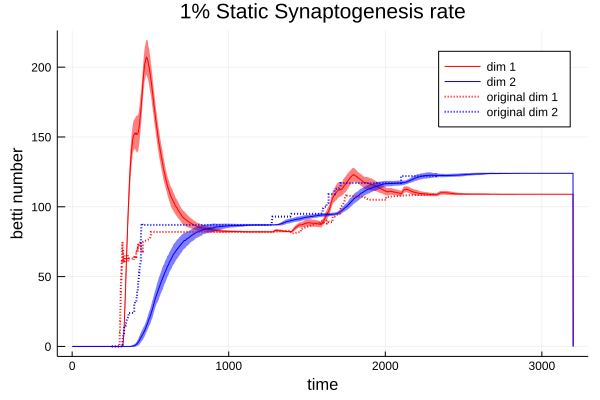

In [16]:
#plots the average of the random curves, which a strip covering +/- 1 std



plot(1:3200, onePercentBettiMeans[:,2:3], color=[:red :blue], ribbon = onePercentBettiStd[:,2:3],  fillalpha=.5, legend=:topright , title = "1% Static Synaptogenesis rate", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], lc=[:red :blue], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


In [17]:
#5% static

In [18]:
#we want to modify the graph by delaying synaptogenesis. in this model we have a 5% chance every minute to form a connection
newModels = zeros(279,279,100)

#loads the matrix with 3000's
for k in 1:100
    for i in 1:279
        for j in 1:279
            newModels[i,j,k] = 3000
        end
    end
end

#constructs models according to growth rule
for k in 1:100

    #lists which connections are 'waiting to be added' (connections where both neurons have formed already)
    connectionsNeeded = zeros(2287)
    mostRecentlyAddedConnection = 0
    
    #iterate through each minute starting at the time right before the first neuron is born
    for t in 253:3000
        
        #add connections to the list
            #figures out if any new neurons were born that had connections to previous neurons
         while (mostRecentlyAddedConnection < 2287) && (timeConnections[mostRecentlyAddedConnection + 1,1] <= t)
            #being here means that the connection listed at index 'mostRecentlyAddedConnecton + 1' is needed
            connectionsNeeded[mostRecentlyAddedConnection + 1] = 1
            mostRecentlyAddedConnection += 1
        end
        
        #now we go through needed connections and give each a chance of being added
        for i in 1:2287
            if connectionsNeeded[i] == 1
                #this means we still need to add this connection
                r = rand()
                
                if r <= 0.05
                    initial = trunc(Int,connections[i,1])
                    terminal = trunc(Int,connections[i,2])
                    newModels[initial, terminal, k] = t
                    newModels[terminal, initial, k] = t
                    connectionsNeeded[i] = 0
                end
            end
        end
    end
             
end

println("output: newModels")

output: newModels


In [19]:
fivePercentBettiCurves = zeros(3000,3,100)

for k in 1:100
    println(k)
    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(newModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 3001, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        fivePercentBettiCurves[t,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        fivePercentBettiCurves[t,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        fivePercentBettiCurves[t,3,k] = bettiNumber
    end

end

println("outpue: fivePercentBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
outpue: fivePercentBettiCurves


In [20]:
#computes average and standard deviation of 100 copies
fivePercentBettiMeans = zeros(3000,3)
fivePercentBettiStd = zeros(3000,3)

for t in 253:3000
    fivePercentBettiMeans[t,1] = mean(fivePercentBettiCurves[t,1,:])
    fivePercentBettiMeans[t,2] = mean(fivePercentBettiCurves[t,2,:])
    fivePercentBettiMeans[t,3] = mean(fivePercentBettiCurves[t,3,:])
    
    fivePercentBettiStd[t,1] = std(fivePercentBettiCurves[t,1,:])
    fivePercentBettiStd[t,2] = std(fivePercentBettiCurves[t,2,:])
    fivePercentBettiStd[t,3] = std(fivePercentBettiCurves[t,3,:])
end

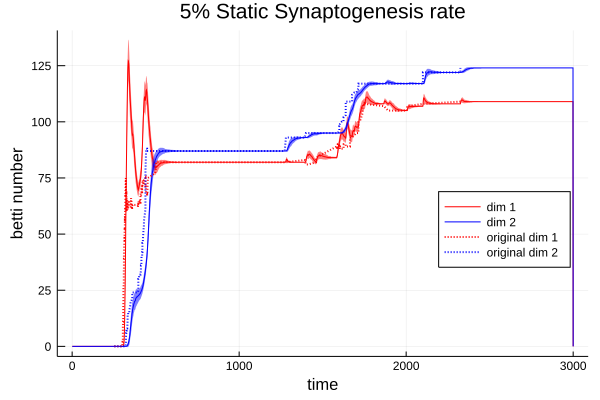

In [22]:
#plots the average of the random curves, which a strip covering +/- 1 std



plot(1:3000, fivePercentBettiMeans[:,2:3], color=[:red :blue], ribbon = fivePercentBettiStd[:,2:3],  fillalpha=.5, legend=:right , title = "5% Static Synaptogenesis rate", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], lc=[:red :blue], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


In [23]:
#10% static

In [24]:
#we want to modify the graph by delaying synaptogenesis. in this model we have a 5% chance every minute to form a connection
tenPercentModels = zeros(279,279,100)

#loads the matrix with 3000's
for k in 1:100
    for i in 1:279
        for j in 1:279
            tenPercentModels[i,j,k] = 3000
        end
    end
end

#constructs models according to growth rule
for k in 1:100

    #lists which connections are 'waiting to be added' (connections where both neurons have formed already)
    connectionsNeeded = zeros(2287)
    mostRecentlyAddedConnection = 0
    
    #iterate through each minute starting at the time right before the first neuron is born
    for t in 253:3000
        
        #add connections to the list
            #figures out if any new neurons were born that had connections to previous neurons
         while (mostRecentlyAddedConnection < 2287) && (timeConnections[mostRecentlyAddedConnection + 1,1] <= t)
            #being here means that the connection listed at index 'mostRecentlyAddedConnecton + 1' is needed
            connectionsNeeded[mostRecentlyAddedConnection + 1] = 1
            mostRecentlyAddedConnection += 1
        end
        
        #now we go through needed connections and give each a chance of being added
        for i in 1:2287
            if connectionsNeeded[i] == 1
                #this means we still need to add this connection
                r = rand()
                
                if r <= 0.1
                    initial = trunc(Int,connections[i,1])
                    terminal = trunc(Int,connections[i,2])
                    tenPercentModels[initial, terminal, k] = t
                    tenPercentModels[terminal, initial, k] = t
                    connectionsNeeded[i] = 0
                end
            end
        end
    end
    
    if sum(connectionsNeeded) > 0
        println(sum(connectionsNeeded))
    end
             
end

println("output: tenPercentModels")

output: tenPercentModels


In [25]:
tenPercentBettiCurves = zeros(3000,3,100)

for k in 1:100
    println(k)
    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(tenPercentModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 3001, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        tenPercentBettiCurves[t,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        tenPercentBettiCurves[t,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        tenPercentBettiCurves[t,3,k] = bettiNumber
    end

end

println("outpue: tenPercentBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
outpue: tenPercentBettiCurves


In [26]:
#computes average and standard deviation of 100 copies
tenPercentBettiMeans = zeros(3000,3)
tenPercentBettiStd = zeros(3000,3)

for t in 253:3000
    tenPercentBettiMeans[t,1] = mean(tenPercentBettiCurves[t,1,:])
    tenPercentBettiMeans[t,2] = mean(tenPercentBettiCurves[t,2,:])
    tenPercentBettiMeans[t,3] = mean(tenPercentBettiCurves[t,3,:])
    
    tenPercentBettiStd[t,1] = std(tenPercentBettiCurves[t,1,:])
    tenPercentBettiStd[t,2] = std(tenPercentBettiCurves[t,2,:])
    tenPercentBettiStd[t,3] = std(tenPercentBettiCurves[t,3,:])
end

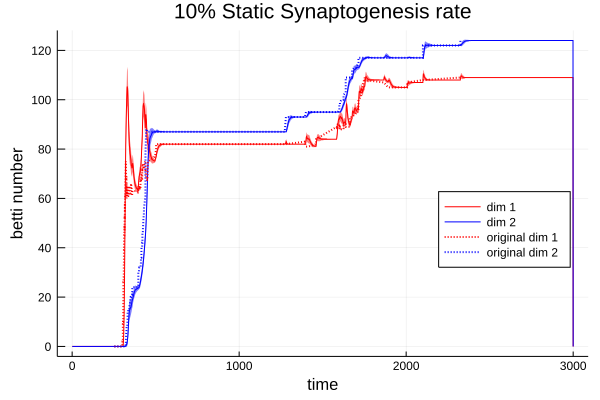

In [51]:
#plots the average of the random curves, which a strip covering +/- 1 std


plot(1:3000, tenPercentBettiMeans[:,2:3], color=[:red :blue], ribbon = tenPercentBettiStd[:,2:3],  fillalpha=.5, legend=:right , title = "10% Static Synaptogenesis rate", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], lc=[:red :blue], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


In [28]:
#1% growing

In [40]:
#okay, but static probability seems unlikely. lets add an increasing chance with every minute that passes

#we want to modify the graph by delaying synaptogenesis. in this model we have a 1+1/minute% chance every minute to form a connection
oneGrowingPercentModels = zeros(279,279,100)

#loads the matrix with 3000's
for k in 1:100
    for i in 1:279
        for j in 1:279
            oneGrowingPercentModels[i,j,k] = 3000
        end
    end
end

#constructs models according to growth rule
for k in 1:100

    #lists which connections are 'waiting to be added' (connections where both neurons have formed already)
    connectionsNeeded = zeros(2287,2)
    mostRecentlyAddedConnection = 0
    
    #iterate through each minute starting at the time right before the first neuron is born
    for t in 253:3000
        
        #add connections to the list
            #figures out if any new neurons were born that had connections to previous neurons
         while (mostRecentlyAddedConnection < 2287) && (timeConnections[mostRecentlyAddedConnection + 1,1] <= t)
            #being here means that the connection listed at index 'mostRecentlyAddedConnecton + 1' is needed
            connectionsNeeded[mostRecentlyAddedConnection + 1,1] = 1
            mostRecentlyAddedConnection += 1
         end
        
        #now we go through needed connections and give each a chance of being added
        for i in 1:2287
            if connectionsNeeded[i,1] == 1
                #this means we still need to add this connection
                r = rand()
                
                if r <= (0.01 + connectionsNeeded[i,2] * 0.01)
                    initial = trunc(Int,connections[i,1])
                    terminal = trunc(Int,connections[i,2])
                    oneGrowingPercentModels[initial, terminal, k] = t
                    oneGrowingPercentModels[terminal, initial, k] = t
                    connectionsNeeded[i,1] = 0
                else
                    connectionsNeeded[i,2] += 1
                end
                    
            end
        end
    end
    
    
    if sum(connectionsNeeded[:,1]) > 0
        println(sum(connectionsNeeded[:,1]))
    end
             
end

println("output: oneGrowingPercentModels")

output: oneGrowingPercentModels


In [41]:
oneGrowingPercentBettiCurves = zeros(3000,3,100)

for k in 1:100
    println(k)
    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(oneGrowingPercentModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 3001, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        oneGrowingPercentBettiCurves[t,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        oneGrowingPercentBettiCurves[t,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        oneGrowingPercentBettiCurves[t,3,k] = bettiNumber
    end

end

println("outpue: oneGrowingPercentBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
outpue: oneGrowingPercentBettiCurves


In [42]:
#computes average and standard deviation of 100 copies
oneGrowingPercentBettiMeans = zeros(3000,3)
oneGrowingPercentBettiStd = zeros(3000,3)

for t in 253:3000
    oneGrowingPercentBettiMeans[t,1] = mean(oneGrowingPercentBettiCurves[t,1,:])
    oneGrowingPercentBettiMeans[t,2] = mean(oneGrowingPercentBettiCurves[t,2,:])
    oneGrowingPercentBettiMeans[t,3] = mean(oneGrowingPercentBettiCurves[t,3,:])
    
    oneGrowingPercentBettiStd[t,1] = std(oneGrowingPercentBettiCurves[t,1,:])
    oneGrowingPercentBettiStd[t,2] = std(oneGrowingPercentBettiCurves[t,2,:])
    oneGrowingPercentBettiStd[t,3] = std(oneGrowingPercentBettiCurves[t,3,:])
end

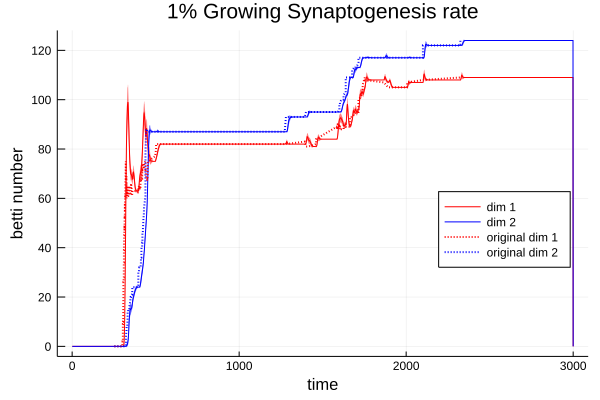

In [50]:
#plots the average of the random curves, which a strip covering +/- 1 std


plot(1:3000, oneGrowingPercentBettiMeans[:,2:3], color=[:red :blue], ribbon = oneGrowingPercentBettiStd[:,2:3],  fillalpha=.5, legend=:right , title = "1% Growing Synaptogenesis rate", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], lc=[:red :blue], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


In [44]:
#we can do even smaller numbers since its growing

In [45]:
#okay, but static probability seems unlikely. lets add an increasing chance with every minute that passes

#we want to modify the graph by delaying synaptogenesis. in this model we have a 1+1/minute% chance every minute to form a connection
tenthGrowingPercentModels = zeros(279,279,100)

#loads the matrix with 3000's
for k in 1:100
    for i in 1:279
        for j in 1:279
            tenthGrowingPercentModels[i,j,k] = 3000
        end
    end
end

#constructs models according to growth rule
for k in 1:100

    #lists which connections are 'waiting to be added' (connections where both neurons have formed already)
    connectionsNeeded = zeros(2287,2)
    mostRecentlyAddedConnection = 0
    
    #iterate through each minute starting at the time right before the first neuron is born
    for t in 253:3000
        
        #add connections to the list
            #figures out if any new neurons were born that had connections to previous neurons
         while (mostRecentlyAddedConnection < 2287) && (timeConnections[mostRecentlyAddedConnection + 1,1] <= t)
            #being here means that the connection listed at index 'mostRecentlyAddedConnecton + 1' is needed
            connectionsNeeded[mostRecentlyAddedConnection + 1,1] = 1
            mostRecentlyAddedConnection += 1
         end
        
        #now we go through needed connections and give each a chance of being added
        for i in 1:2287
            if connectionsNeeded[i,1] == 1
                #this means we still need to add this connection
                r = rand()
                
                if r <= (0.001 + connectionsNeeded[i,2] * 0.001)
                    initial = trunc(Int,connections[i,1])
                    terminal = trunc(Int,connections[i,2])
                    tenthGrowingPercentModels[initial, terminal, k] = t
                    tenthGrowingPercentModels[terminal, initial, k] = t
                    connectionsNeeded[i,1] = 0
                else
                    connectionsNeeded[i,2] += 1
                end
                    
            end
        end
    end
    
    
    if sum(connectionsNeeded[:,1]) > 0
        println(sum(connectionsNeeded[:,1]))
    end
             
end

println("output: tenthGrowingPercentModels")

output: tenthGrowingPercentModels


In [46]:
tenthGrowingPercentBettiCurves = zeros(3000,3,100)

for k in 1:100
    println(k)
    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(tenthGrowingPercentModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 3001, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        tenthGrowingPercentBettiCurves[t,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        tenthGrowingPercentBettiCurves[t,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        tenthGrowingPercentBettiCurves[t,3,k] = bettiNumber
    end

end

println("outpue: tenthGrowingPercentBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
outpue: tenthGrowingPercentBettiCurves


In [47]:
#computes average and standard deviation of 100 copies
tenthGrowingPercentBettiMeans = zeros(3000,3)
tenthGrowingPercentBettiStd = zeros(3000,3)

for t in 253:3000
    tenthGrowingPercentBettiMeans[t,1] = mean(tenthGrowingPercentBettiCurves[t,1,:])
    tenthGrowingPercentBettiMeans[t,2] = mean(tenthGrowingPercentBettiCurves[t,2,:])
    tenthGrowingPercentBettiMeans[t,3] = mean(tenthGrowingPercentBettiCurves[t,3,:])
    
    tenthGrowingPercentBettiStd[t,1] = std(tenthGrowingPercentBettiCurves[t,1,:])
    tenthGrowingPercentBettiStd[t,2] = std(tenthGrowingPercentBettiCurves[t,2,:])
    tenthGrowingPercentBettiStd[t,3] = std(tenthGrowingPercentBettiCurves[t,3,:])
end

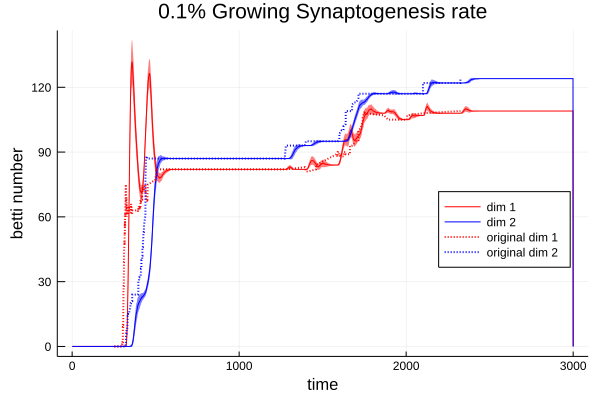

In [49]:
#plots the average of the random curves, which a strip covering +/- 1 std


plot(1:3000, tenthGrowingPercentBettiMeans[:,2:3], color=[:red :blue], ribbon = tenthGrowingPercentBettiStd[:,2:3],  fillalpha=.5, legend=:right , title = "0.1% Growing Synaptogenesis rate", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], lc=[:red :blue], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


In [52]:
#okay, but static probability seems unlikely. lets add an increasing chance with every minute that passes

#we want to modify the graph by delaying synaptogenesis. in this model we have a 1+1/minute% chance every minute to form a connection
fiveGrowingPercentModels = zeros(279,279,100)

#loads the matrix with 3000's
for k in 1:100
    for i in 1:279
        for j in 1:279
            fiveGrowingPercentModels[i,j,k] = 3000
        end
    end
end

#constructs models according to growth rule
for k in 1:100

    #lists which connections are 'waiting to be added' (connections where both neurons have formed already)
    connectionsNeeded = zeros(2287,2)
    mostRecentlyAddedConnection = 0
    
    #iterate through each minute starting at the time right before the first neuron is born
    for t in 253:3000
        
        #add connections to the list
            #figures out if any new neurons were born that had connections to previous neurons
         while (mostRecentlyAddedConnection < 2287) && (timeConnections[mostRecentlyAddedConnection + 1,1] <= t)
            #being here means that the connection listed at index 'mostRecentlyAddedConnecton + 1' is needed
            connectionsNeeded[mostRecentlyAddedConnection + 1,1] = 1
            mostRecentlyAddedConnection += 1
         end
        
        #now we go through needed connections and give each a chance of being added
        for i in 1:2287
            if connectionsNeeded[i,1] == 1
                #this means we still need to add this connection
                r = rand()
                
                if r <= (0.05 + connectionsNeeded[i,2] * 0.05)
                    initial = trunc(Int,connections[i,1])
                    terminal = trunc(Int,connections[i,2])
                    fiveGrowingPercentModels[initial, terminal, k] = t
                    fiveGrowingPercentModels[terminal, initial, k] = t
                    connectionsNeeded[i,1] = 0
                else
                    connectionsNeeded[i,2] += 1
                end
                    
            end
        end
    end
    
    
    if sum(connectionsNeeded[:,1]) > 0
        println(sum(connectionsNeeded[:,1]))
    end
             
end

println("output: fiveGrowingPercentModels")

output: fiveGrowingPercentModels


In [53]:
fiveGrowingPercentBettiCurves = zeros(3000,3,100)

for k in 1:100
    println(k)
    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(fiveGrowingPercentModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 3001, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        fiveGrowingPercentBettiCurves[t,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        fiveGrowingPercentBettiCurves[t,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        fiveGrowingPercentBettiCurves[t,3,k] = bettiNumber
    end

end

println("outpue: fiveGrowingPercentBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
outpue: fiveGrowingPercentBettiCurves


In [54]:
#computes average and standard deviation of 100 copies
fiveGrowingPercentBettiMeans = zeros(3000,3)
fiveGrowingPercentBettiStd = zeros(3000,3)

for t in 253:3000
    fiveGrowingPercentBettiMeans[t,1] = mean(fiveGrowingPercentBettiCurves[t,1,:])
    fiveGrowingPercentBettiMeans[t,2] = mean(fiveGrowingPercentBettiCurves[t,2,:])
    fiveGrowingPercentBettiMeans[t,3] = mean(fiveGrowingPercentBettiCurves[t,3,:])
    
    fiveGrowingPercentBettiStd[t,1] = std(fiveGrowingPercentBettiCurves[t,1,:])
    fiveGrowingPercentBettiStd[t,2] = std(fiveGrowingPercentBettiCurves[t,2,:])
    fiveGrowingPercentBettiStd[t,3] = std(fiveGrowingPercentBettiCurves[t,3,:])
end

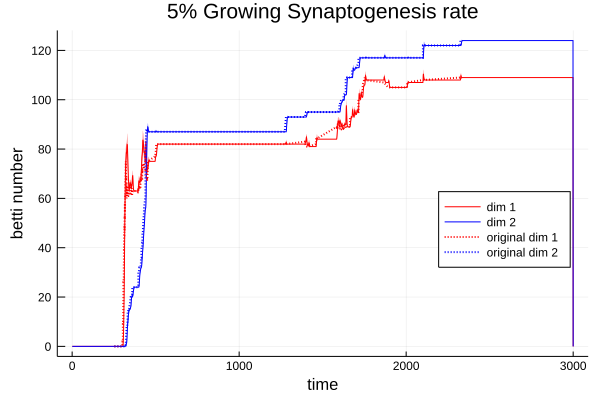

In [55]:
#plots the average of the random curves, which a strip covering +/- 1 std


plot(1:3000, fiveGrowingPercentBettiMeans[:,2:3], color=[:red :blue], ribbon = fiveGrowingPercentBettiStd[:,2:3],  fillalpha=.5, legend=:right , title = "5% Growing Synaptogenesis rate", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], lc=[:red :blue], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


In [6]:
#okay, but static probability seems unlikely. lets add an increasing chance with every minute that passes

#we want to modify the graph by delaying synaptogenesis. in this model we have a 1+1/minute% chance every minute to form a connection
averageDegreePercentModels = zeros(279,279,100)

#loads the matrix with 3000's
for k in 1:100
    for i in 1:279
        for j in 1:279
            averageDegreePercentModels[i,j,k] = 3100
        end
    end
end

#determines the degree of each neuron
degree = zeros(279)
for i in 1:279
    for j in 1:279
        if birthSortedAdjacencyMatrix[i,j] < 300
            degree[i] += 1
        end
    end
end

#constructs models according to growth rule
for k in 1:100

    #lists which connections are 'waiting to be added' (connections where both neurons have formed already)
    connectionsNeeded = zeros(2287,2)
    mostRecentlyAddedConnection = 0
    
    #iterate through each minute starting at the time right before the first neuron is born
    for t in 253:3100
        
        #add connections to the list
            #figures out if any new neurons were born that had connections to previous neurons
         while (mostRecentlyAddedConnection < 2287) && (timeConnections[mostRecentlyAddedConnection + 1,1] <= t)
            #being here means that the connection listed at index 'mostRecentlyAddedConnecton + 1' is needed
            connectionsNeeded[mostRecentlyAddedConnection + 1,1] = 1
            mostRecentlyAddedConnection += 1
         end
        
        #now we go through needed connections and give each a chance of being added
        for i in 1:2287
            if connectionsNeeded[i,1] == 1
                #this means we still need to add this connection
                r = rand()
                initial = trunc(Int,connections[i,1])
                terminal = trunc(Int,connections[i,2])
                
                if r <= ( degree[terminal] + degree[initial]  )/2000
                    averageDegreePercentModels[initial, terminal, k] = t
                    averageDegreePercentModels[terminal, initial, k] = t
                    connectionsNeeded[i,1] = 0
                else
                    connectionsNeeded[i,2] += 1
                end
                    
            end
        end
    end
    
    
    if sum(connectionsNeeded[:,1]) > 0
        println(sum(connectionsNeeded[:,1]))
    end

end

println("output: averageDegreePercentModels")

1.0
output: averageDegreePercentModels


In [7]:
averageDegreePercentBettiCurves = zeros(3100,3,100)

for k in 1:100
    println(k)
    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(averageDegreePercentModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 3101, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for t in 253:3100
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        averageDegreePercentBettiCurves[t,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3100
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        averageDegreePercentBettiCurves[t,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3100
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        averageDegreePercentBettiCurves[t,3,k] = bettiNumber
    end

end

println("outpue: averageDegreePercentBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
outpue: averageDegreePercentBettiCurves


In [10]:
#computes average and standard deviation of 100 copies
averageDegreePercentBettiMeans = zeros(3100,3)
averageDegreePercentBettiStd = zeros(3100,3)

for t in 253:3100
    averageDegreePercentBettiMeans[t,1] = mean(averageDegreePercentBettiCurves[t,1,:])
    averageDegreePercentBettiMeans[t,2] = mean(averageDegreePercentBettiCurves[t,2,:])
    averageDegreePercentBettiMeans[t,3] = mean(averageDegreePercentBettiCurves[t,3,:])
    
    averageDegreePercentBettiStd[t,1] = std(averageDegreePercentBettiCurves[t,1,:])
    averageDegreePercentBettiStd[t,2] = std(averageDegreePercentBettiCurves[t,2,:])
    averageDegreePercentBettiStd[t,3] = std(averageDegreePercentBettiCurves[t,3,:])
end

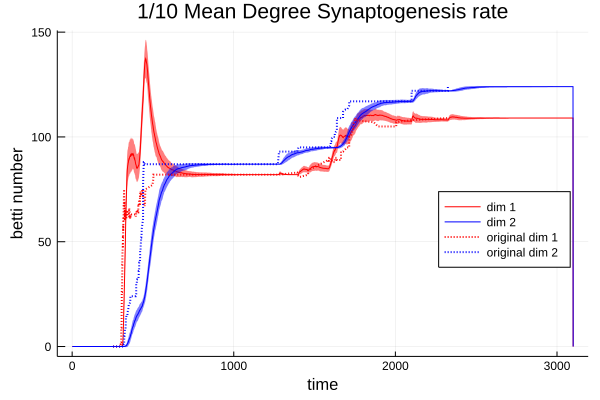

In [11]:
#plots the average of the random curves, with a strip covering +/- 1 std


plot(1:3100, averageDegreePercentBettiMeans[:,2:3], color=[:red :blue], ribbon = averageDegreePercentBettiStd[:,2:3],  fillalpha=.5, legend=:right , title = "1/10 Mean Degree Synaptogenesis rate", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], lc=[:red :blue], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


In [12]:
#lets see what the heck a fully random synaptogenesis looks like

#we want to modify the graph by delaying synaptogenesis. in this model we have a 1+1/minute% chance every minute to form a connection
fullyRandomModels = zeros(279,279,100)

#loads the matrix with 3000's
for k in 1:100
    for i in 1:279
        for j in 1:279
            fullyRandomModels[i,j,k] = 3000
        end
    end
end

#constructs models according to growth rule
for k in 1:100

   for i in 1:2287
        #pick a random time (given both neurons are born)
        initialTime = trunc(Int64,timeConnections[i,1])
        connectionTime = rand(initialTime:3000)
        
        #forge the connection between the neurons at that time
        initial = trunc(Int64,connections[i,1])
        terminal = trunc(Int64,connections[i,2])
        fullyRandomModels[initial,terminal,k] = connectionTime
        fullyRandomModels[terminal,initial,k] = connectionTime
    end
end

println("output: fullyRandomModels")

output: fullyRandomModels


In [13]:
fullyRandomBettiCurves = zeros(3000,3,100)

for k in 1:100
    println(k)
    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(fullyRandomModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 3001, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        fullyRandomBettiCurves[t,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        fullyRandomBettiCurves[t,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        fullyRandomBettiCurves[t,3,k] = bettiNumber
    end

end

println("outpue: fullyRandomBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
outpue: fullyRandomBettiCurves


In [14]:
#computes average and standard deviation of 100 copies
fullyRandomBettiMeans = zeros(3000,3)
fullyRandomBettiStd = zeros(3000,3)

for t in 253:3000
    fullyRandomBettiMeans[t,1] = mean(fullyRandomBettiCurves[t,1,:])
    fullyRandomBettiMeans[t,2] = mean(fullyRandomBettiCurves[t,2,:])
    fullyRandomBettiMeans[t,3] = mean(fullyRandomBettiCurves[t,3,:])
    
    fullyRandomBettiStd[t,1] = std(fullyRandomBettiCurves[t,1,:])
    fullyRandomBettiStd[t,2] = std(fullyRandomBettiCurves[t,2,:])
    fullyRandomBettiStd[t,3] = std(fullyRandomBettiCurves[t,3,:])
end

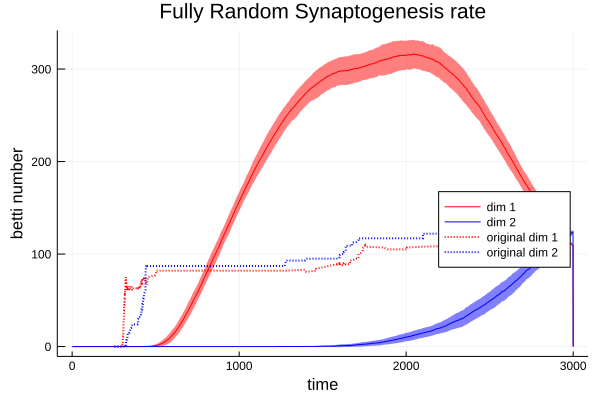

In [15]:
#plots the average of the random curves, which a strip covering +/- 1 std


plot(1:3000, fullyRandomBettiMeans[:,2:3], color=[:red :blue], ribbon = fullyRandomBettiStd[:,2:3],  fillalpha=.5, legend=:right , title = "Fully Random Synaptogenesis rate", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], lc=[:red :blue], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


In [15]:
labelsTimesPositionsType[201,2]

502.65

In [18]:
#lets see what the heck a fully random synaptogenesis looks like, given embryonic neurons are all born before birth

#we want to modify the graph by delaying synaptogenesis. in this model we have a 1+1/minute% chance every minute to form a connection
constrainedRandomModels = zeros(279,279,100)

#loads the matrix with 3000's
for k in 1:100
    for i in 1:279
        for j in 1:279
            constrainedRandomModels[i,j,k] = 3000
        end
    end
end

#constructs models according to growth rule
for k in 1:100

   for i in 1:2287
        #first handle pre-embryonic cases
        if connections[i,1] < 202
        #pick a random time (given both neurons are born)
        initialTime = trunc(Int64,timeConnections[i,1])
        connectionTime = rand(initialTime:650)
        
        #forge the connection between the neurons at that time
        initial = trunc(Int64,connections[i,1])
        terminal = trunc(Int64,connections[i,2])
        constrainedRandomModels[initial,terminal,k] = connectionTime
        constrainedRandomModels[terminal,initial,k] = connectionTime
        else
        #pick a random time (given both neurons are born)
        initialTime = trunc(Int64,timeConnections[i,1])
        connectionTime = rand(initialTime:3000)
        
        #forge the connection between the neurons at that time
        initial = trunc(Int64,connections[i,1])
        terminal = trunc(Int64,connections[i,2])
        constrainedRandomModels[initial,terminal,k] = connectionTime
        constrainedRandomModels[terminal,initial,k] = connectionTime        
        end
    end
end

println("output: fullyRandomModels")

output: fullyRandomModels


In [19]:
constrainedRandomBettiCurves = zeros(3000,3,100)

for k in 1:100
    println(k)
    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(constrainedRandomModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 3001, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        constrainedRandomBettiCurves[t,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        constrainedRandomBettiCurves[t,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if barcodes[j,1] == t
                bettiNumber += 1
            end
            if barcodes[j,2] == t
                bettiNumber -= 1
            end
        end
        constrainedRandomBettiCurves[t,3,k] = bettiNumber
    end

end

println("outpue: constrainedRandomBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
outpue: constrainedRandomBettiCurves


In [20]:
#computes average and standard deviation of 100 copies
constrainedRandomBettiMeans = zeros(3000,3)
constrainedRandomBettiStd = zeros(3000,3)

for t in 253:3000
    constrainedRandomBettiMeans[t,1] = mean(constrainedRandomBettiCurves[t,1,:])
    constrainedRandomBettiMeans[t,2] = mean(constrainedRandomBettiCurves[t,2,:])
    constrainedRandomBettiMeans[t,3] = mean(constrainedRandomBettiCurves[t,3,:])
    
    constrainedRandomBettiStd[t,1] = std(constrainedRandomBettiCurves[t,1,:])
    constrainedRandomBettiStd[t,2] = std(constrainedRandomBettiCurves[t,2,:])
    constrainedRandomBettiStd[t,3] = std(constrainedRandomBettiCurves[t,3,:])
end

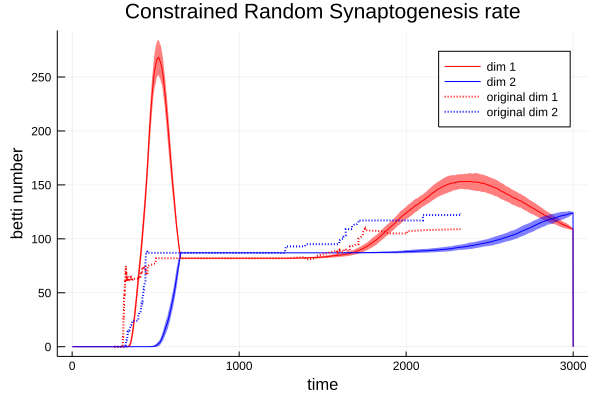

In [22]:
#plots the average of the random curves, which a strip covering +/- 1 std


plot(1:3000, constrainedRandomBettiMeans[:,2:3], color=[:red :blue], ribbon = constrainedRandomBettiStd[:,2:3],  fillalpha=.5, legend=:topright , title = "Constrained Random Synaptogenesis rate", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], lc=[:red :blue], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


1733

In [87]:
#lets modify birth times and do birth timed betti curves
birthNumberedMatrix = zeros(279,279,100)
birthTimes = labelsTimesPositionsType[:,2]

#loads the matrix with the right values's
for k in 1:100
    for i in 1:279
        for j in 1:279
            birthNumberedMatrix[i,j,k] = birthSortedAdjacencyMatrix[i,j]
            
            if birthNumberedMatrix[i,j,k] == 300
                birthNumberedMatrix[i,j,k] = 3000
            end
        end
    end
end

#shuffle birth times slightly
for k in 1:100
    for i in 1:279
        r = rand()
        if r < 0.5
            birthTimes[i] *= (1.05)
        else
            birthTimes[i] *= (.95) 
        end
    end
end
    
#change values in the matrix
for k in 1:100
    for i in 1:279
        for j in 1:279
            if birthNumberedMatrix[i,j,k] < 3000
                birthNumberedMatrix[i,j,k] = maximum([labelsTimesPositionsType[i,2],labelsTimesPositionsType[j,2]])
            end
        end
    end
end
  

println("output: birthNumberedMatrix")

output: birthNumberedMatrix


In [88]:
birthNumberedBettiCurves = zeros(3000,3,100)

for k in 1:100
    println(k)
    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(birthNumberedMatrix[:,:,k], model = "vr", minrad = 0.5, maxrad = 3001, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for t in 253:3000
        for j in 1:amount
            if (barcodes[j,1] > (t - 1)) && (barcodes[j,1] <= t)
                bettiNumber += 1
            end
            if (barcodes[j,2] > (t - 1)) && (barcodes[j,2] <= t)
                bettiNumber -= 1
            end
        end
        birthNumberedBettiCurves[t,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if (barcodes[j,1] > (t - 1)) && (barcodes[j,1] <= t)
                bettiNumber += 1
            end
            if (barcodes[j,2] > (t - 1)) && (barcodes[j,2] <= t)
                bettiNumber -= 1
            end
        end
        birthNumberedBettiCurves[t,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for t in 253:3000
        for j in 1:amount
            if (barcodes[j,1] > (t - 1)) && (barcodes[j,1] <= t)
                bettiNumber += 1
            end
            if (barcodes[j,2] > (t - 1)) && (barcodes[j,2] <= t)
                bettiNumber -= 1
            end
        end
        birthNumberedBettiCurves[t,3,k] = bettiNumber
    end

end

println("outpue: birthNumberedBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
outpue: birthNumberedBettiCurves


In [89]:
#computes average and standard deviation of 100 copies
birthNumberedPercentBettiMeans = zeros(3000,3)
birthNumberedPercentBettiStd = zeros(3000,3)

for t in 253:3000
    birthNumberedPercentBettiMeans[t,1] = mean(birthNumberedBettiCurves[t,1,:])
    birthNumberedPercentBettiMeans[t,2] = mean(birthNumberedBettiCurves[t,2,:])
    birthNumberedPercentBettiMeans[t,3] = mean(birthNumberedBettiCurves[t,3,:])
    
    birthNumberedPercentBettiStd[t,1] = std(birthNumberedBettiCurves[t,1,:])
    birthNumberedPercentBettiStd[t,2] = std(birthNumberedBettiCurves[t,2,:])
    birthNumberedPercentBettiStd[t,3] = std(birthNumberedBettiCurves[t,3,:])
end

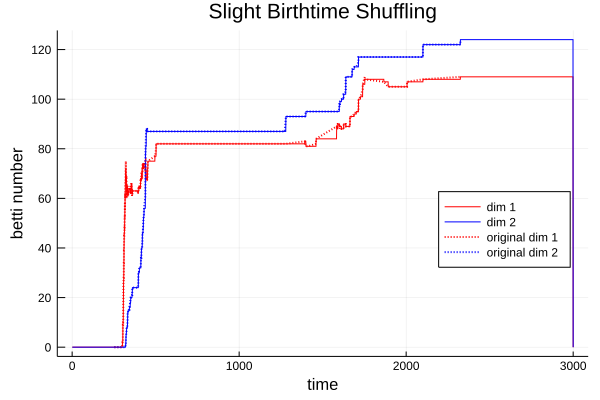

In [92]:
#plots the average of the random curves, which a strip covering +/- 1 std


plot(1:3000, birthNumberedPercentBettiMeans[:,2:3], color=[:red :blue], ribbon = birthNumberedPercentBettiStd[:,2:3],  fillalpha=.5, legend=:right , title = "Slight Birthtime Shuffling", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], lc=[:red :blue], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


done


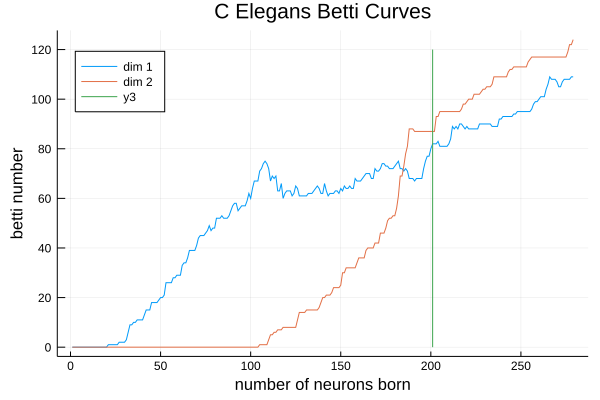

In [165]:
#plot the betti curves for dimension 1 and 2 by node
plot(1:279, BettiCurves[:,2:3], title = "C Elegans Betti Curves", label = ["dim 1", "dim 2"], legend=:topleft ,  xlabel = "number of neurons born", ylabel = "betti number")
sticks!(1:279, location[:])

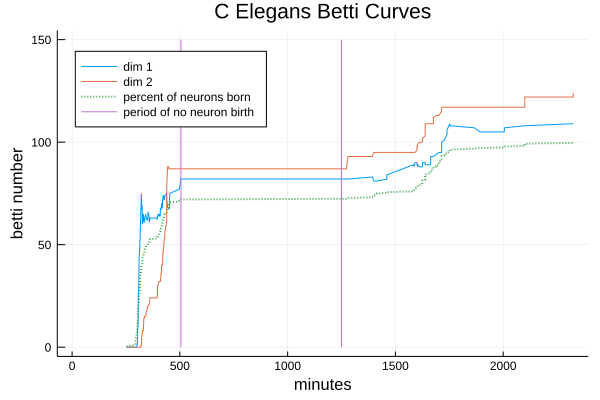

In [181]:
#plot of betti curves for dimension 1 and 2
location = zeros(1300)
location[505] = 150
location[1250] = 150
whatToGraph = zeros(279,3)
whatToGraph[:,1:2] = BettiCurves[:,2:3]
for i in 1:279
    whatToGraph[i,3] = i/279 * 100
end

plot(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], title = "C Elegans Betti Curves", label = ["dim 1", "dim 2"], legend=:topleft ,  xlabel = "minutes", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], whatToGraph[:,3], line=(:dot,2), label = "percent of neurons born")
sticks!(1:1300, location[:], label = "period of no neuron birth")

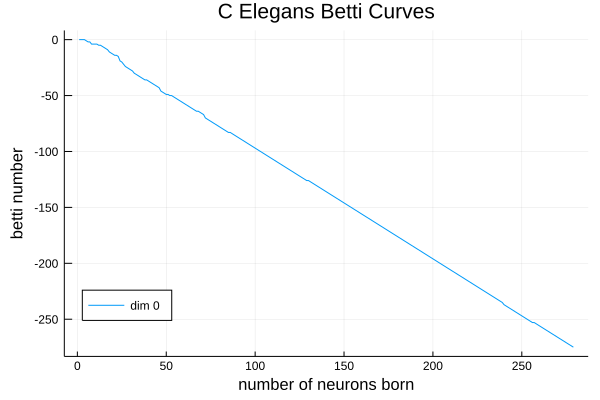

In [11]:
#plot dimension 0 betti curve

p1 = plot(1:279, BettiCurves[:,1], title = "C Elegans Betti Curves", label = ["dim 0"], legend=:bottomleft ,  xlabel = "number of neurons born", ylabel = "betti number")

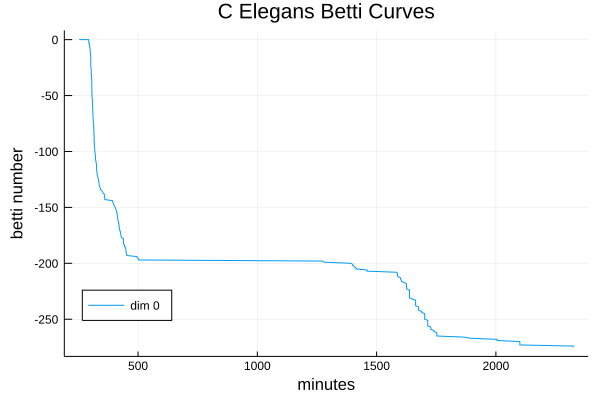

In [12]:
#plot dimension 0 betti curve

p1 = plot(labelsTimesPositionsType[:,2], BettiCurves[:,1], title = "C Elegans Betti Curves", label = ["dim 0"], legend=:bottomleft ,  xlabel = "minutes", ylabel = "betti number")

In [13]:
#find birth and death rate graphs of cavities in dimension 1 and 2
eireneGraph = eirene(birthSortedAdjacencyMatrix, model = "vr", minrad = 0.5, maxrad = 301, maxdim = 2)
barcodesOne = barcode(eireneGraph, dim =1)
barcodesTwo = barcode(eireneGraph, dim = 2)

#construct rates matrix for each dimension using a +/- 5 window. column 1 is birth rate, column 2 is death rate
dimensionOneRates = zeros(279,2)
dimensionTwoRates = zeros(279,2)


for i in 1:279
    #make and clear counters for new barcodes born and dying in each i+/-5 window
    newBirths1 = 0
    newDeaths1 = 0
    newBirths2 = 0
    newDeaths2 = 0
    
    #look through each barcode to see if one is either born or dies at time i+/1 5
    for j in i-5:i+1
        
        #handle case where j<1 or j > 279
        if j > 0 && j < 280
            newBirths1 += size(findall(x -> x == j, barcodesOne[:,1]))[1]
            newDeaths1 += size(findall(x -> x == j, barcodesOne[:,2]))[1]
        end
        
        if j > 0 && j < 280
            newBirths2 += size(findall(x -> x == j, barcodesTwo[:,1]))[1]
            newDeaths2 += size(findall(x -> x == j, barcodesTwo[:,2]))[1]
        end
    end
        
        
    #set rates at i to be the number of births/deaths in the window centered at i divided by the size of that window
        
    #handle cases where i is too close to boundary and the width is not quite 11
    if i <= 5 
        minimum = 1
    end
    if i > 5
        minimum = i-5
    end
    
    if i <= 274 
        maximum = i+5
    end
    if i > 274
        maximum = 279
    end
    
    normalizer = maximum - minimum + 1
        
    dimensionOneRates[i,1] = newBirths1/normalizer
    dimensionOneRates[i,2] = newDeaths1/normalizer
    dimensionTwoRates[i,1] = newBirths2/normalizer
    dimensionTwoRates[i,2] = newDeaths2/normalizer
    
end

println("output: dimensionOneRates and dimensionTwoRates")

output: dimensionOneRates and dimensionTwoRates


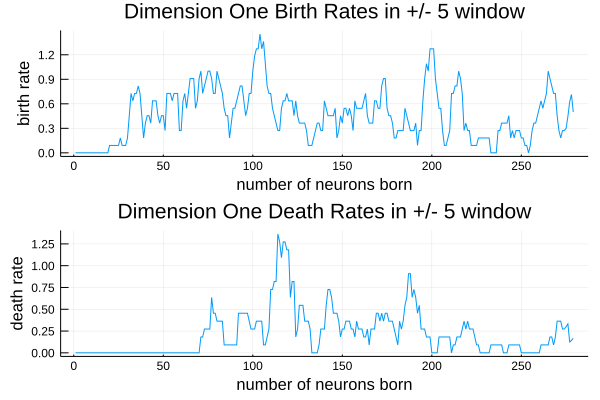

In [14]:
#plot the one dimension birth and death rates by time
p1 = plot(1:279, dimensionOneRates[:,1], title = "Dimension One Birth Rates in +/- 5 window", legend = false, label = ["birth rate"], xlabel = "number of neurons born", ylabel = "birth rate")
p2 = plot(1:279, dimensionOneRates[:,2], title = "Dimension One Death Rates in +/- 5 window", legend = false, label = ["death rate"], xlabel = "number of neurons born", ylabel = "death rate")

plot(p1, p2, layout = (2,1))

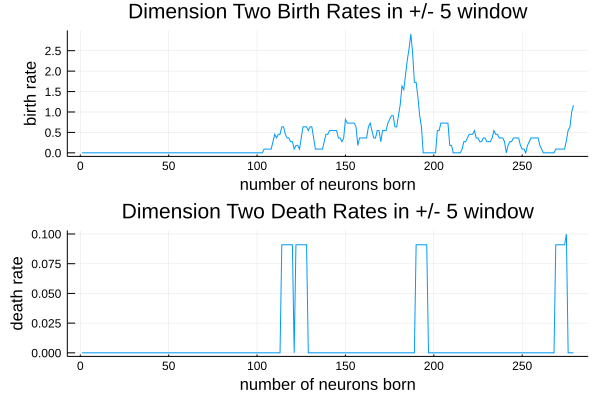

In [15]:
#plot the one dimension birth and death rates by time
p1 = plot(1:279, dimensionTwoRates[:,1], title = "Dimension Two Birth Rates in +/- 5 window", legend = false, label = ["birth rate"], xlabel = "number of neurons born", ylabel = "birth rate")
p2 = plot(1:279, dimensionTwoRates[:,2], title = "Dimension Two Death Rates in +/- 5 window", legend = false, label = ["death rate"], xlabel = "number of neurons born", ylabel = "death rate")

plot(p1, p2, layout = (2,1))

In [63]:
#store array of birth rates separated by pre- and post- embyronic phases and by area
dimOneBirthRatesPre = zeros(201)
dimOneBirthRatesPost = zeros(78)
dimOneBirthRatesHead = zeros(160)
dimOneBirthRatesBody = zeros(92)
dimOneBirthRatesTail = zeros(27)

dimOneDeathRatesPre = zeros(201)
dimOneDeathRatesPost = zeros(78)
dimOneDeathRatesHead = zeros(160)
dimOneDeathRatesBody = zeros(92)
dimOneDeathRatesTail = zeros(27)

dimTwoBirthRatesPre = zeros(201)
dimTwoBirthRatesPost = zeros(78)
dimTwoBirthRatesHead = zeros(160)
dimTwoBirthRatesBody = zeros(92)
dimTwoBirthRatesTail = zeros(27)

dimTwoDeathRatesPre = zeros(201)
dimTwoDeathRatesPost = zeros(78)
dimTwoDeathRatesHead = zeros(160)
dimTwoDeathRatesBody = zeros(92)
dimTwoDeathRatesTail = zeros(27)

headCounter = 0
bodyCounter = 0
tailCounter = 0

#load the arrays with the appropriate values
for i in 1:201
    dimOneBirthRatesPre[i] = dimensionOneRates[i,1]
    dimOneDeathRatesPre[i] = dimensionOneRates[i,2]
    
    dimTwoBirthRatesPre[i] = dimensionTwoRates[i,1]
    dimTwoDeathRatesPre[i] = dimensionTwoRates[i,2]
end

for i in 202:279
    dimOneBirthRatesPost[i-201] = dimensionOneRates[i,1]
    dimOneDeathRatesPost[i-201] = dimensionOneRates[i,2]
    
    dimTwoBirthRatesPost[i-201] = dimensionTwoRates[i,1]
    dimTwoDeathRatesPost[i-201] = dimensionTwoRates[i,2]
end

for i in 1:279
    #head region
    if labelsTimesPositionsType[i,3] < 0
        headCounter += 1
        dimOneBirthRatesHead[headCounter] = dimensionOneRates[i,1]
        dimOneDeathRatesHead[headCounter] = dimensionOneRates[i,2]
        dimTwoBirthRatesHead[headCounter] = dimensionTwoRates[i,1]
        dimTwoDeathRatesHead[headCounter] = dimensionTwoRates[i,2]
    end
    
    #body region
    if labelsTimesPositionsType[i,3] > 0 && labelsTimesPositionsType[i,3] < 0.935
        bodyCounter += 1
        dimOneBirthRatesBody[bodyCounter] = dimensionOneRates[i,1]
        dimOneDeathRatesBody[bodyCounter] = dimensionOneRates[i,2]
        dimTwoBirthRatesBody[bodyCounter] = dimensionTwoRates[i,1]
        dimTwoDeathRatesBody[bodyCounter] = dimensionTwoRates[i,2]
    end
    
    #tail region
    if labelsTimesPositionsType[i,3] > 0.935
        tailCounter += 1
        dimOneBirthRatesTail[tailCounter] = dimensionOneRates[i,1]
        dimOneDeathRatesTail[tailCounter] = dimensionOneRates[i,2]
        dimTwoBirthRatesTail[tailCounter] = dimensionTwoRates[i,1]
        dimTwoDeathRatesTail[tailCounter] = dimensionTwoRates[i,2]
    end
end

println("output: many")

output: many


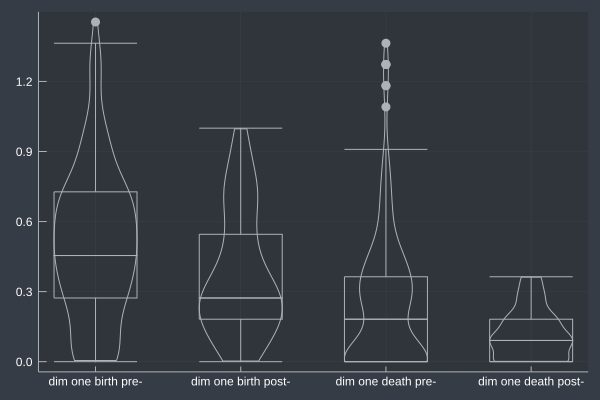

In [17]:
#plot dimension one and two pre vs post birth and death rates
plotArray = Array{Any,1}(UndefInitializer(), 4)
plotArray[1] = dimOneBirthRatesPre[:]
plotArray[2] = dimOneBirthRatesPost[:]
plotArray[3] = dimOneDeathRatesPre[:]
plotArray[4] = dimOneDeathRatesPost[:]


violin(["dim one birth pre-" "dim one birth post-" "dim one death pre-" "dim one death post-"],plotArray,leg=false, color = theme(:dark))
boxplot!(["dim one birth pre-" "dim one birth post-" "dim one death pre-" "dim one death post-"],plotArray,leg=false, color = theme(:dark))

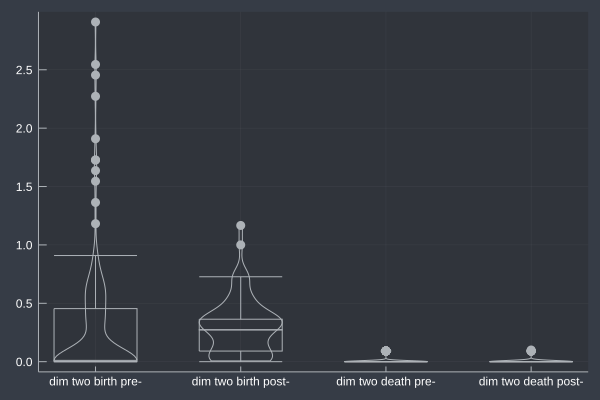

In [18]:
#plot dimension one and two pre vs post birth and death rates
plotArray = Array{Any,1}(UndefInitializer(), 4)

plotArray[1] = dimTwoBirthRatesPre[:]
plotArray[2] = dimTwoBirthRatesPost[:]
plotArray[3] = dimTwoDeathRatesPre[:]
plotArray[4] = dimTwoDeathRatesPost[:]

violin(["dim two birth pre-" "dim two birth post-" "dim two death pre-" "dim two death post-"],plotArray,leg=false, color = theme(:dark))
boxplot!(["dim two birth pre-" "dim two birth post-" "dim two death pre-" "dim two death post-"],plotArray,leg=false, color = theme(:dark))

In [19]:
#do test of signifigance for each dimension one birth pre vs post
MannWhitneyUTest(dimOneBirthRatesPre, dimOneBirthRatesPost)


Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          0.18181818181818182

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           0.0021

Details:
    number of observations in each group: [201, 78]
    Mann-Whitney-U statistic:             9695.0
    rank sums:                            [28031.5, 11028.5]
    adjustment for ties:                  170370.0
    normal approximation (μ, σ):          (1856.0, 602.4534732230103)


In [20]:
#do test of signifigance for dimension one death pre vs post
MannWhitneyUTest(dimOneDeathRatesPre, dimOneDeathRatesPost)


Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          0.09090909090909091

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           0.0063

Details:
    number of observations in each group: [201, 78]
    Mann-Whitney-U statistic:             9448.5
    rank sums:                            [23857.0, 15203.0]
    adjustment for ties:                  1.114878e6
    normal approximation (μ, σ):          (1609.5, 589.1012972975063)


In [21]:
#do test of signifigance for dimension two birth pre vs post
MannWhitneyUTest(dimTwoBirthRatesPre, dimTwoBirthRatesPost)


Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          -0.2727272727272727

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           0.0009

Details:
    number of observations in each group: [201, 78]
    Mann-Whitney-U statistic:             5923.5
    rank sums:                            [22852.5, 16207.5]
    adjustment for ties:                  2.01405e6
    normal approximation (μ, σ):          (-1915.5, 576.1025567002988)


In [22]:
#do test of signifigance for dimension two death pre vs post
MannWhitneyUTest(dimTwoDeathRatesPre, dimTwoDeathRatesPost)


Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          0.0

Test summary:
    outcome with 95% confidence: fail to reject h_0
    two-sided p-value:           0.7400

Details:
    number of observations in each group: [201, 78]
    Mann-Whitney-U statistic:             7944.0
    rank sums:                            [27564.0, 11496.0]
    adjustment for ties:                  1.5832656e7
    normal approximation (μ, σ):          (105.0, 314.8418958061946)


In [23]:
#find birth and death rate graphs of cavities in dimension 1 and 2 by a time window
eireneGraph = eirene(birthSortedAdjacencyMatrix, model = "vr", minrad = 0.5, maxrad = 301, maxdim = 2)
barcodesOne = barcode(eireneGraph, dim =1)
barcodesTwo = barcode(eireneGraph, dim = 2)

#construct rates matrix for each dimension using a +/- 5 time window. column 1 is birth rate, column 2 is death rate
dimensionOneRates = zeros(279,2)
dimensionTwoRates = zeros(279,2)

#determine the node-ranges for each time window
initialAndTerminalNodeForEachWindow = zeros(279,2)
for i in 1:279
    
    terminal = 1
    while terminal < 280 && labelsTimesPositionsType[terminal,2] < labelsTimesPositionsType[i,2] + 5
        terminal += 1
    end
    terminal -= 1
    
    initial = 279
    while initial > 0 && labelsTimesPositionsType[initial,2] > labelsTimesPositionsType[i,2] - 5
        initial -= 1
    end
    initial += 1
    
    initialAndTerminalNodeForEachWindow[i,1] = initial
    initialAndTerminalNodeForEachWindow[i,2] = terminal
end

    

for i in 1:279
    #make and clear counters for new barcodes born and dying in each i+/-5 window
    newBirths1 = 0
    newDeaths1 = 0
    newBirths2 = 0
    newDeaths2 = 0
    
    #look through each barcode to see if one either is born or dies at time i+/1 5
    for j in initialAndTerminalNodeForEachWindow[i,1]:initialAndTerminalNodeForEachWindow[i,2]
        
        newBirths1 += size(findall(x -> x == j, barcodesOne[:,1]))[1]
        newDeaths1 += size(findall(x -> x == j, barcodesOne[:,2]))[1]
        
        newBirths2 += size(findall(x -> x == j, barcodesTwo[:,1]))[1]
        newDeaths2 += size(findall(x -> x == j, barcodesTwo[:,2]))[1]
        
    end
        
        
    #set rates at i to be the number of births/deaths in the window centered at i divided by the size of that window
        
    #handle case where i is too close to boundary and the width is not quite 11
    initial = trunc(Int, initialAndTerminalNodeForEachWindow[i,1])
    terminal = trunc(Int, initialAndTerminalNodeForEachWindow[i,2])
    timeWindow = labelsTimesPositionsType[terminal,2] - labelsTimesPositionsType[initial,2]

      
    dimensionOneRates[i,1] = newBirths1/timeWindow
    dimensionOneRates[i,2] = newDeaths1/timeWindow
    dimensionTwoRates[i,1] = newBirths2/timeWindow
    dimensionTwoRates[i,2] = newDeaths2/timeWindow
    
end

println("output: dimensionOneRates and dimensionTwoRates")

output: dimensionOneRates and dimensionTwoRates


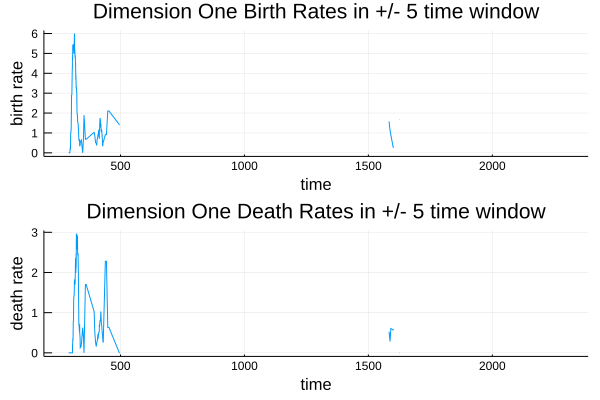

In [27]:
#plot the one dimension birth and death rates by number of neurons born
p1 = plot(labelsTimesPositionsType[:,2], dimensionOneRates[:,1], title = "Dimension One Birth Rates in +/- 5 time window", legend = false, label = ["birth rate"], xlabel = "time", ylabel = "birth rate")
p2 = plot(labelsTimesPositionsType[:,2], dimensionOneRates[:,2], title = "Dimension One Death Rates in +/- 5 time window", legend = false, label = ["death rate"], xlabel = "time", ylabel = "death rate")

plot(p1, p2, layout = (2,1))

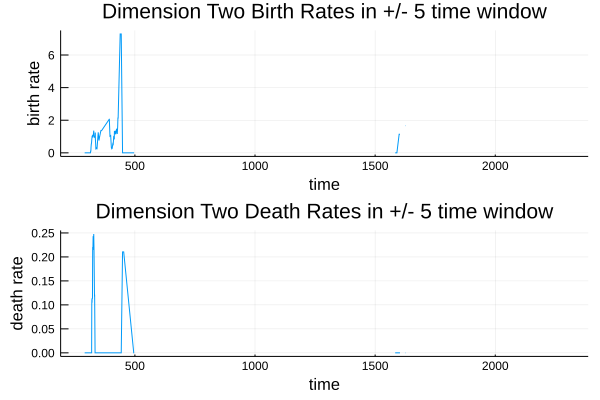

In [28]:
#plot the one dimension birth and death rates by number of neurons born
p1 = plot(labelsTimesPositionsType[:,2], dimensionTwoRates[:,1], title = "Dimension Two Birth Rates in +/- 5 time window", legend = false, label = ["birth rate"], xlabel = "time", ylabel = "birth rate")
p2 = plot(labelsTimesPositionsType[:,2], dimensionTwoRates[:,2], title = "Dimension Two Death Rates in +/- 5 time window", legend = false, label = ["death rate"], xlabel = "time", ylabel = "death rate")

plot(p1, p2, layout = (2,1))

In [234]:
#make 1000 models by varying birth times and adding random edges
randomModels = zeros(279,279,1000)

#load all the models with the base
for k in 1:1000
    randomModels[:,:,k] = birthSortedAdjacencyMatrix[:,:]


    #reconstruct each as a binary matrix to ease calculations
    for i in 1:279
        for j in 1:279
            if randomModels[i,j,k] < 300
                randomModels[i,j,k] = 1
            end
            if randomModels[i,j,k] == 300
                randomModels[i,j,k] = 0
            end
        end
    end


    #for each model, add 810 random connections
    for counter in 1:810
        initial = rand(1:279)
        terminal = rand(1:279)
        while terminal == initial
            terminal = rand(1:279)
        end
        
        randomModels[initial,terminal,k] = 1
        randomModels[terminal,initial,k] = 1
    end


    #alter the birth times of each neuron
    bornTimes = labelsTimesPositionsType[:,2]

    for i in 1:201
        sign = rand()
    
        if sign < 0.5
            error = rand()
            percentError = error*0.1
            error = bornTimes[i] * percentError
            bornTimes[i] += error
            if percentError > 0.1 || percentError < 0
                println("fucl")
            end
        end
    
        if sign >= 0.5
            error = rand()
            percentError = error*0.1
            error = bornTimes[i] * percentError
            bornTimes[i] -= error
            if percentError > 0.1 || percentError < 0
                println("fucl")
            end
        end
    end

    for i in 202:279
        sign = rand()
    
        if sign < 0.5
            error = rand()
            percentError = error*0.02
            error = bornTimes[i] * percentError
            bornTimes[i] += error
            if percentError > 0.02 || percentError < 0
                println("fucl")
            end
        end
    
        if sign >= 0.5
            error = rand()
            percentError = error*0.02
            error = bornTimes[i] * percentError
            bornTimes[i] -= error
            if percentError > 0.02 || percentError < 0
                println("fucl")
            end
        end
    end
    
    #reorder the current matrix by birth time
    for i in 1:279
        movement = 0
    
        while i - movement > 1 && bornTimes[i - movement] < bornTimes[i-movement - 1]
            shadowCache = bornTimes[i - movement]
            bornTimes[i - movement] = bornTimes[i - movement - 1]
            bornTimes[i - movement - 1] = shadowCache
            
            shadowCache = randomModels[i - movement, :,k]
            randomModels[i - movement, :,k] = randomModels[i - movement - 1, :,k]
            randomModels[i - movement - 1, :,k] = shadowCache
            
            shadowCache = randomModels[:,i - movement, k]
            randomModels[:,i - movement, k] = randomModels[:,i - movement - 1, k]
            randomModels[:,i - movement - 1, k] = shadowCache
        
            movement += 1
        end
    end
    
    #re-label the random models for eirene calculations
    for i in 1:279
        for j in 1:279
            if randomModels[i,j,k] == 1
                randomModels[i,j,k] = maximum([i,j])
            end
            if randomModels[i,j,k] == 0
                randomModels[i,j,k] = 300
            end
        end
    end
end

println("output: randomModels")

output: randomModels


In [ ]:
RandomizedBettiCurves = zeros(279,3,1000)

for k in 1:1000
    
    println(k)

    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(randomModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 301, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for i in 1:279
        for j in 1:amount
            if barcodes[j,1] == i
                bettiNumber += 1
            end
            if barcodes[j,2] == i
                bettiNumber -= 1
            end
        end
        RandomizedBettiCurves[i,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for i in 1:279
        for j in 1:amount
            if barcodes[j,1] == i
                bettiNumber += 1
            end
            if barcodes[j,2] == i
                bettiNumber -= 1
            end
        end
        RandomizedBettiCurves[i,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for i in 1:279
        for j in 1:amount
            if barcodes[j,1] == i
                bettiNumber += 1
            end
            if barcodes[j,2] == i
                bettiNumber -= 1
            end
        end
        RandomizedBettiCurves[i,3,k] = bettiNumber
    end
end

println("outpue: RandomizedBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [228]:
#computes average and standard deviation of 1000 copies
bettiMeans = zeros(279,3)
bettiStd = zeros(279,3)

for i in 1:279
    bettiMeans[i,1] = mean(RandomizedBettiCurves[i,1,:])
    bettiMeans[i,2] = mean(RandomizedBettiCurves[i,2,:])
    bettiMeans[i,3] = mean(RandomizedBettiCurves[i,3,:])
    
    bettiStd[i,1] = std(RandomizedBettiCurves[i,1,:])
    bettiStd[i,2] = std(RandomizedBettiCurves[i,2,:])
    bettiStd[i,3] = std(RandomizedBettiCurves[i,3,:])
end

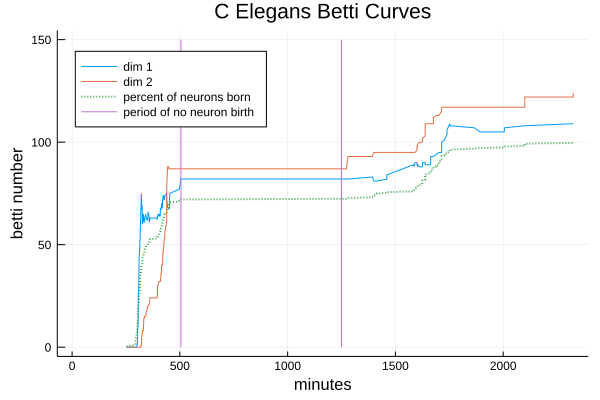

In [223]:
#plot of betti curves for dimension 1 and 2
location = zeros(1300)
location[505] = 150
location[1250] = 150
whatToGraph = zeros(279,3)
whatToGraph[:,1:2] = BettiCurves[:,2:3]
for i in 1:279
    whatToGraph[i,3] = i/279 * 100
end

plot(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], title = "C Elegans Betti Curves", label = ["dim 1", "dim 2"], legend=:topleft ,  xlabel = "minutes", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], whatToGraph[:,3], line=(:dot,2), label = "percent of neurons born")
sticks!(1:1300, location[:], label = "period of no neuron birth")

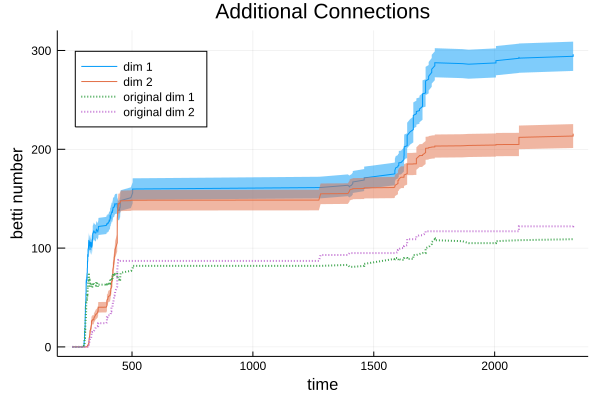

In [233]:
#plots the average of the random curves, which a strip covering +/- 1 std

whatToGraph = zeros(279,4)
whatToGraph[:,1:2] = BettiCurves[:,2:3]
whatToGraph[:,3:4] = bettiMeans[:,2:3]


plot(labelsTimesPositionsType[:,2], bettiMeans[:,2:3], ribbon = bettiStd[:,2:3], legend=:topleft , title = "Additional Connections", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")
plot!(labelsTimesPositionsType[:,2], BettiCurves[:,2:3], line=(:dot,2), label = [ "original dim 1" "original dim 2"])


In [226]:
#perform randomization where we add connections but dont re-order birth times
randomModels = zeros(279,279,1000)

#load all the models with the base
for k in 1:1000
    randomModels[:,:,k] = birthSortedAdjacencyMatrix[:,:]


    #reconstruct each as a binary matrix to ease calculations
    for i in 1:279
        for j in 1:279
            if randomModels[i,j,k] < 300
                randomModels[i,j,k] = 1
            end
            if randomModels[i,j,k] == 300
                randomModels[i,j,k] = 0
            end
        end
    end


    #for each model, add 810 random connections
    for counter in 1:810
        initial = rand(1:279)
        terminal = rand(1:279)
        while terminal == initial
            terminal = rand(1:279)
        end
        
        randomModels[initial,terminal,k] = 1
        randomModels[terminal,initial,k] = 1
    end


    
    #re-label the random models for eirene calculations
    for i in 1:279
        for j in 1:279
            if randomModels[i,j,k] == 1
                randomModels[i,j,k] = maximum([i,j])
            end
            if randomModels[i,j,k] == 0
                randomModels[i,j,k] = 300
            end
        end
    end
end

println("output: randomModels")

output: randomModels


In [227]:
RandomizedBettiCurves = zeros(279,3,1000)

for k in 1:1000
    
    println(k)

    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(randomModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 301, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for i in 1:279
        for j in 1:amount
            if barcodes[j,1] == i
                bettiNumber += 1
            end
            if barcodes[j,2] == i
                bettiNumber -= 1
            end
        end
        RandomizedBettiCurves[i,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for i in 1:279
        for j in 1:amount
            if barcodes[j,1] == i
                bettiNumber += 1
            end
            if barcodes[j,2] == i
                bettiNumber -= 1
            end
        end
        RandomizedBettiCurves[i,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for i in 1:279
        for j in 1:amount
            if barcodes[j,1] == i
                bettiNumber += 1
            end
            if barcodes[j,2] == i
                bettiNumber -= 1
            end
        end
        RandomizedBettiCurves[i,3,k] = bettiNumber
    end
end

println("outpue: RandomizedBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [230]:
#computes average and standard deviation of 1000 copies
bettiMeans = zeros(279,3)
bettiStd = zeros(279,3)

for i in 1:279
    bettiMeans[i,1] = mean(RandomizedBettiCurves[i,1,:])
    bettiMeans[i,2] = mean(RandomizedBettiCurves[i,2,:])
    bettiMeans[i,3] = mean(RandomizedBettiCurves[i,3,:])
    
    bettiStd[i,1] = std(RandomizedBettiCurves[i,1,:])
    bettiStd[i,2] = std(RandomizedBettiCurves[i,2,:])
    bettiStd[i,3] = std(RandomizedBettiCurves[i,3,:])
end

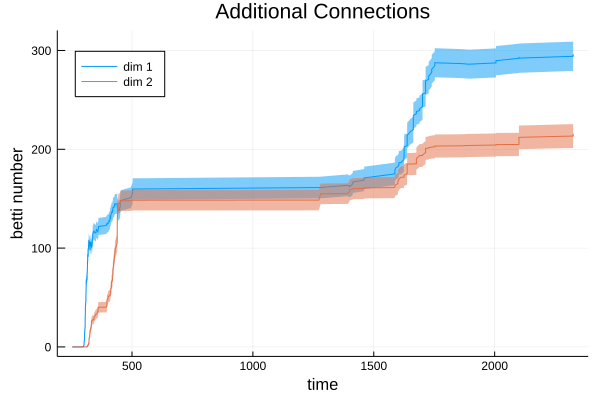

In [231]:
#plots the average of the random curves, which a strip covering +/- 1 std
plot(labelsTimesPositionsType[:,2], bettiMeans[:,2:3], ribbon = bettiStd[:,2:3], legend=:topleft , title = "Additional Connections", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")

In [206]:
#perform randomization where we re-order birth times but dont add connections 

randomModels = zeros(279,279,1000)

#load all the models with the base
for k in 1:1000
    randomModels[:,:,k] = birthSortedAdjacencyMatrix[:,:]


    #reconstruct each as a binary matrix to ease calculations
    for i in 1:279
        for j in 1:279
            if randomModels[i,j,k] < 300
                randomModels[i,j,k] = 1
            end
            if randomModels[i,j,k] == 300
                randomModels[i,j,k] = 0
            end
        end
    end


    #alter the birth times of each neuron
    bornTimes = labelsTimesPositionsType[:,2]

    for i in 1:201
        sign = rand()
    
        if sign < 0.5
            error = rand()
            percentError = error*0.1
            error = bornTimes[i] * percentError
            bornTimes[i] += error
            if percentError > 0.1 || percentError < 0
                println("fucl")
            end
        end
    
        if sign >= 0.5
            error = rand()
            percentError = error*0.1
            error = bornTimes[i] * percentError
            bornTimes[i] -= error
            if percentError > 0.1 || percentError < 0
                println("fucl")
            end
        end
    end

    for i in 202:279
        sign = rand()
    
        if sign < 0.5
            error = rand()
            percentError = error*0.02
            error = bornTimes[i] * percentError
            bornTimes[i] += error
            if percentError > 0.02 || percentError < 0
                println("fucl")
            end
        end
    
        if sign >= 0.5
            error = rand()
            percentError = error*0.02
            error = bornTimes[i] * percentError
            bornTimes[i] -= error
            if percentError > 0.02 || percentError < 0
                println("fucl")
            end
        end
    end
    
    #reorder the current matrix by birth time
    for i in 1:279
        movement = 0
    
        while i - movement > 1 && bornTimes[i - movement] < bornTimes[i-movement - 1]
            shadowCache = bornTimes[i - movement]
            bornTimes[i - movement] = bornTimes[i - movement - 1]
            bornTimes[i - movement - 1] = shadowCache
            
            shadowCache = randomModels[i - movement, :,k]
            randomModels[i - movement, :,k] = randomModels[i - movement - 1, :,k]
            randomModels[i - movement - 1, :,k] = shadowCache
            
            shadowCache = randomModels[:,i - movement, k]
            randomModels[:,i - movement, k] = randomModels[:,i - movement - 1, k]
            randomModels[:,i - movement - 1, k] = shadowCache
        
            movement += 1
        end
    end
    
    #re-label the random models for eirene calculations
    for i in 1:279
        for j in 1:279
            if randomModels[i,j,k] == 1
                randomModels[i,j,k] = maximum([i,j])
            end
            if randomModels[i,j,k] == 0
                randomModels[i,j,k] = 300
            end
        end
    end
end

println("output: randomModels")

output: randomModels


In [207]:
RandomizedBettiCurves = zeros(279,3,1000)

for k in 1:1000
    
    println(k)

    #computes the betti curves in 0-2 dimensions

    eireneMatrix = eirene(randomModels[:,:,k], model = "vr", minrad = 0.5, maxrad = 301, maxdim = 2)

    #make stuff to store betti curves
    barcodes = barcode(eireneMatrix, dim=0)
    amount = size(barcodes,1)
    bettiNumber = 0

    #calculate and store dimension 0 betti values
    for i in 1:279
        for j in 1:amount
            if barcodes[j,1] == i
                bettiNumber += 1
            end
            if barcodes[j,2] == i
                bettiNumber -= 1
            end
        end
        RandomizedBettiCurves[i,1,k] = bettiNumber
    end

    #calculate and store dimension 1 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=1)
    amount = size(barcodes,1)
    bettiNumber = 0

    for i in 1:279
        for j in 1:amount
            if barcodes[j,1] == i
                bettiNumber += 1
            end
            if barcodes[j,2] == i
                bettiNumber -= 1
            end
        end
        RandomizedBettiCurves[i,2,k] = bettiNumber
    end

    #calculate and store dimension 2 betti values (resetting variables first)
    barcodes = barcode(eireneMatrix, dim=2)
    amount = size(barcodes,1)
    bettiNumber = 0

    for i in 1:279
        for j in 1:amount
            if barcodes[j,1] == i
                bettiNumber += 1
            end
            if barcodes[j,2] == i
                bettiNumber -= 1
            end
        end
        RandomizedBettiCurves[i,3,k] = bettiNumber
    end
end

println("outpue: RandomizedBettiCurves")

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [208]:
#computes average and standard deviation of 1000 copies
bettiMeans = zeros(279,3)
bettiStd = zeros(279,3)

for i in 1:279
    bettiMeans[i,1] = mean(RandomizedBettiCurves[i,1,:])
    bettiMeans[i,2] = mean(RandomizedBettiCurves[i,2,:])
    bettiMeans[i,3] = mean(RandomizedBettiCurves[i,3,:])
    
    bettiStd[i,1] = std(RandomizedBettiCurves[i,1,:])
    bettiStd[i,2] = std(RandomizedBettiCurves[i,2,:])
    bettiStd[i,3] = std(RandomizedBettiCurves[i,3,:])
end

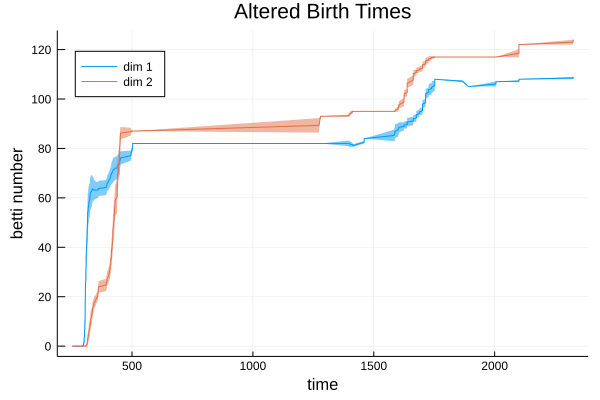

In [209]:
#plots the average of the random curves, which a strip covering +/- 1 std
plot(labelsTimesPositionsType[:,2], bettiMeans[:,2:3], ribbon = bettiStd[:,2:3], legend=:topleft , title = "Altered Birth Times", label = ["dim 1", "dim 2"],  xlabel = "time", ylabel = "betti number")

In [ ]:
####end of betti curve analysis

In [ ]:
#beginning of topological similarity analysis

In [ ]:
#computes first dimensional topological similarity (can skip and just import from csv)

#hold barcodes for topological similarity calculation  
barcodes = Array{Any, 2}(UndefInitializer(), 279,279)

eireneGraph = eirene(birthSortedAdjacencyMatrix[:,:], minrad = 0.5, maxrad = 301, maxdim = 1)

oneDimBarcodes = barcode(eireneGraph, dim = 1)
originalBarcodes = zeros(size(oneDimBarcodes)[1],3)


#stores the information for the non-reordered matrix
if size(oneDimBarcodes)[1] > 0
    for i in 1:size(oneDimBarcodes)[1]
        originalBarcodes[i,1] = 1
        originalBarcodes[i,2] = oneDimBarcodes[i,1]
        originalBarcodes[i,3] = oneDimBarcodes[i,2]
    end
end

barcodes[1,1] = originalBarcodes


#runs calculations for all pairwise reorderings
for i in 2:279
    for j in 1: i-1
        
        #loads a matrix with node i and j having swapped birht times
        newArray = birthSortedAdjacencyMatrix[:,:]
        for a in 1:279
            if newArray[i,a] < 300
                newArray[i,a] = maximum([j,a])
                newArray[a,i] = maximum([j,a])
            end
            
            if newArray[j,a] < 300
                newArray[j,a] = maximum([i,a])
                newArray[a,j] = maximum([i,a])
            end
        end
        
        #runs the persistent homology of the reordered matrix
        eireneReordered = eirene(newArray, minrad = 0.5, maxrad = 301, maxdim =1)
        reorderedBarcodes = barcode(eireneReordered, dim =1)
            
        newBarcodes = zeros(size(reorderedBarcodes)[1],3)

        if size(reorderedBarcodes)[1] > 0
            for i in 1:size(reorderedBarcodes)[1]
                newBarcodes[i,1] = 1
                newBarcodes[i,2] = reorderedBarcodes[i,1]
                newBarcodes[i,3] = reorderedBarcodes[i,2]
            end
        end
        
        #stores the barcodes of this reordered matrix
        barcodes[i,j] = newBarcodes
    
    end
end

#compute topological similarity for this graph
oneDimensionalTopologicalSimilarity = zeros(279,279)

baseline = barcodes[1,1]

for i in 2:279
    for j in 1:i-1
        reordered = barcodes[i,j]
        
        bottleneckDistance = rcopy(R"bottleneck($baseline, $reordered, dimension = 1)")
        oneDimensionSimilarity = 1 - ( bottleneckDistance / abs(i-j) )
        oneDimensionalTopologicalSimilarity[i,j] = oneDimensionSimilarity
        
    end
end


println("output: oneDimensionalTopologicalSimilarity")

In [ ]:
#computes second dimensional topological similarity (can skip and just import from csv)

#hold barcodes for topological similarity calculation  
barcodes = Array{Any, 2}(UndefInitializer(), 279,279)

eireneGraph = eirene(birthSortedAdjacencyMatrix[:,:], minrad = 0.5, maxrad = 301, maxdim = 2)

twoDimBarcodes = barcode(eireneGraph, dim = 2)
originalBarcodes = zeros(size(twoDimBarcodes)[1],3)


#stores the information for the non-reordered matrix
if size(twoDimBarcodes)[1] > 0
    for i in 1:size(twoDimBarcodes)[1]
        originalBarcodes[i,1] = 2
        originalBarcodes[i,2] = twoDimBarcodes[i,1]
        originalBarcodes[i,3] = twoDimBarcodes[i,2]
    end
end

barcodes[1,1] = originalBarcodes


#runs calculations for all pairwise reorderings
for i in 2:279
    for j in 1: i-1
        
        #loads a matrix with node i and j having swapped birht times
        newArray = birthSortedAdjacencyMatrix[:,:]
        for a in 1:279
            if newArray[i,a] < 300
                newArray[i,a] = maximum([j,a])
                newArray[a,i] = maximum([j,a])
            end
            
            if newArray[j,a] < 300
                newArray[j,a] = maximum([i,a])
                newArray[a,j] = maximum([i,a])
            end
        end
        
        #runs the persistent homology of the reordered matrix
        eireneReordered = eirene(newArray, minrad = 0.5, maxrad = 301, maxdim = 2)
        reorderedBarcodes = barcode(eireneReordered, dim = 2)
            
        newBarcodes = zeros(size(reorderedBarcodes)[1],3)

        if size(reorderedBarcodes)[1] > 0
            for i in 1:size(reorderedBarcodes)[1]
                newBarcodes[i,1] = 2
                newBarcodes[i,2] = reorderedBarcodes[i,1]
                newBarcodes[i,3] = reorderedBarcodes[i,2]
            end
        end
        
        #stores the barcodes of this reordered matrix
        barcodes[i,j] = newBarcodes
    
    end
end

#compute topological similarity for this graph
oneDimensionalTopologicalSimilarity = zeros(279,279)

baseline = barcodes[1,1]

for i in 2:279
    for j in 1:i-1
        reordered = barcodes[i,j]
        
        bottleneckDistance = rcopy(R"bottleneck($baseline, $reordered, dimension = 2)")
        twoDimensionSimilarity = 1 - ( bottleneckDistance / abs(i-j) )
        twoDimensionalTopologicalSimilarity[i,j] = twoDimensionSimilarity
        
    end
end


println("output: twoDimensionalTopologicalSimilarity")

In [ ]:
#run this if not using the csv file to compute topological similarity

topologicalSimilarity = oneDimensionalTopologicalSimilarity[:,:]/2 + twoDimensionalTopologicalSimilarity[:,:]/2
println("output: topologicalSimilarity")

In [127]:
#run this if pulling from the csv file

#stores topological similarity
topologicalSimilarity = zeros(279,279)
for i in 1:279
    for j in 1:279
        topologicalSimilarity[i,j] = oneDimTopSim[i,j]/2 + twoDimTopSim[i,j]/2
    end
end



println("output: topologicalSimilarity")

output: topologicalSimilarity


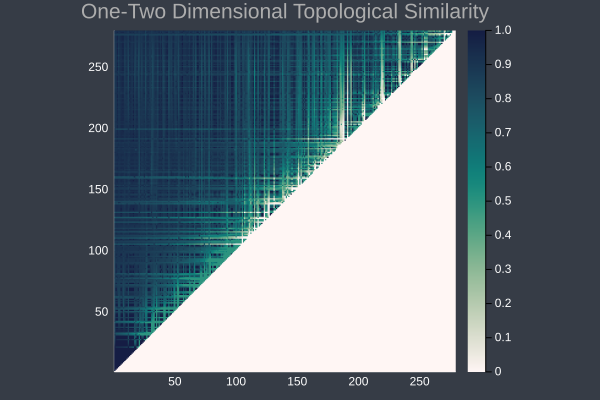

In [128]:
#plots topological similarity
heatmap(topologicalSimilarity, yflip = false, aspect_ratio=:equal, title = "One-Two Dimensional Topological Similarity", color = :tempo)

In [39]:
#test on reorderability between types

#variables for connections within a type
intraSensorySimilarities = zeros(3570) #85 sensory neurons
intraMotorSimilarities = zeros(6555) #115 motor neurons
intraInterSimilarities = zeros(3081) # 79 inter neurons
intraSensoryCounter = 1
intraMotorCounter = 1
intraInterCounter = 1


#variables for connections between different types and a fixed type
interSensorySimilarities = zeros(16490) 
interMotorSimilarities = zeros(18860) 
interInterSimilarities = zeros(15800)
interSensoryCounter = 1
interMotorCounter = 1
interInterCounter = 1

#variables for general within types connections
intraTypeSimilariteis = zeros(13206)
intraCounter = 1

#variabels for general between types connections
interTypeSimilariteis = zeros(25575)
interCounter = 1





#loads all the various arrays
for i in 2:279
    for j in 1:i-1
        
        #see if the connection is intra-type
        if labelsTimesPositionsType[i,5] == labelsTimesPositionsType[j,5]
            
            #determine which type the connection is, add the similarity to the list, and up the ticker
            if labelsTimesPositionsType[i,5] == "sensory"
                intraSensorySimilarities[intraSensoryCounter] = topologicalSimilarity[i,j]
                intraSensoryCounter += 1
            end
            
            if labelsTimesPositionsType[i,5] == "motor"
                intraMotorSimilarities[intraMotorCounter] = topologicalSimilarity[i,j]
                intraMotorCounter += 1
            end
            
            if labelsTimesPositionsType[i,5] == "inter"
                intraInterSimilarities[intraInterCounter] = topologicalSimilarity[i,j]
                intraInterCounter += 1
            end
            
            intraTypeSimilariteis[intraCounter]  = topologicalSimilarity[i,j]
            intraCounter += 1
            
        end
        
        #otherwise the connection is a general InterType
        if labelsTimesPositionsType[i,5] != labelsTimesPositionsType[j,5]
            
            #determine which types the connection is between, add the similarity to the lists, and up the tickers
            if labelsTimesPositionsType[i,5] == "sensory" || labelsTimesPositionsType[j,5] == "sensory"
                interSensorySimilarities[interSensoryCounter] = topologicalSimilarity[i,j]
                interSensoryCounter += 1
            end
            
            if labelsTimesPositionsType[i,5] == "motor" || labelsTimesPositionsType[j,5] == "motor"
                interMotorSimilarities[interMotorCounter] = topologicalSimilarity[i,j]
                interMotorCounter += 1
            end
            
            if labelsTimesPositionsType[i,5] == "inter" || labelsTimesPositionsType[j,5] == "inter"
                interInterSimilarities[interInterCounter] = topologicalSimilarity[i,j]
                interInterCounter += 1
            end
                      
            interTypeSimilariteis[interCounter] = topologicalSimilarity[i,j]
            interCounter += 1
        end
    end
end

println("many outputs")

many outputs


In [40]:
#do test of signifigance for each intra vs inter sensory pair
MannWhitneyUTest(intraSensorySimilarities, interSensorySimilarities)

Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          0.020960187353629922

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-10

Details:
    number of observations in each group: [3570, 16490]
    Mann-Whitney-U statistic:             3.15396515e7
    rank sums:                            [3.79139e7, 1.63298e8]
    adjustment for ties:                  1.08544017e9
    normal approximation (μ, σ):          (2.1050015e6, 313690.1637253867)


In [41]:
#do test of signifigance for each intra vs inter motor pair
MannWhitneyUTest(intraMotorSimilarities, interMotorSimilarities)

Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          0.010808270676691767

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-12

Details:
    number of observations in each group: [6555, 18860]
    Mann-Whitney-U statistic:             6.5482082e7
    rank sums:                            [8.69694e7, 2.36004e8]
    adjustment for ties:                  2.53079151e9
    normal approximation (μ, σ):          (3.668432e6, 511666.15523205)


In [42]:
#do test of signifigance for each intra vs inter inter pair
MannWhitneyUTest(intraInterSimilarities, interInterSimilarities)

Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          -0.020617816091954122

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-14

Details:
    number of observations in each group: [3081, 15800]
    Mann-Whitney-U statistic:             2.21193995e7
    rank sums:                            [2.68672e7, 1.51388e8]
    adjustment for ties:                  5.27843808e8
    normal approximation (μ, σ):          (-2.2205005e6, 276751.9800490103)


In [43]:
#do test of signifigance for each intra-inter pair
MannWhitneyUTest(intraTypeSimilariteis, interTypeSimilariteis)

Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          0.007058823529411673

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-6

Details:
    number of observations in each group: [13206, 25575]
    Mann-Whitney-U statistic:             1.74215768e8
    rank sums:                            [2.61422e8, 4.90581e8]
    adjustment for ties:                  7.953789768e9
    normal approximation (μ, σ):          (5.344043e6, 1.0446921500627488e6)


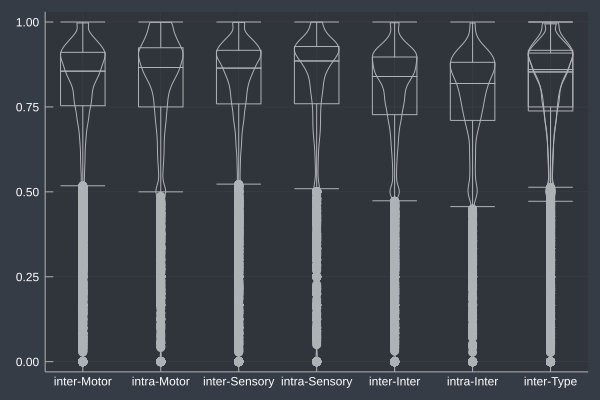

In [44]:
plotArray = Array{Any,1}(UndefInitializer(), 8)
plotArray[1] = interMotorSimilarities[:]
plotArray[2] = intraMotorSimilarities[:]
plotArray[3] = interSensorySimilarities[:]
plotArray[4] = intraSensorySimilarities[:]
plotArray[5] = interInterSimilarities[:]
plotArray[6] = intraInterSimilarities[:]
plotArray[7] = interTypeSimilariteis[:]
plotArray[8] = intraTypeSimilariteis[:]

violin(["inter-Motor" "intra-Motor" "inter-Sensory" "intra-Sensory" "inter-Inter" "intra-Inter" "inter-Type" "inter-Type"],plotArray,leg=false, color = theme(:dark))
boxplot!(["inter-Motor" "intra-Motor" "inter-Sensory" "intra-Sensory" "inter-Inter" "intra-Inter" "inter-Type" "inter-Type"],plotArray,leg=false, color = theme(:dark))

In [45]:
#store an array of all 92 indices of L-R pairs
LRindices = zeros(92,2)
counter = 0

for i in 1:279
    if (labelsTimesPositionsType[i,1])[end] == 'L' && labelsTimesPositionsType[i,1] != "AVL"
        counter += 1
        LRindices[counter, 1] = i
        
        rIndex = 0
        while LRindices[counter,2] == 0
            rIndex += 1
            
            if (labelsTimesPositionsType[rIndex, 1])[end] == 'R' && (labelsTimesPositionsType[rIndex, 1])[1:end-1] == (labelsTimesPositionsType[i,1])[1:end-1]
                LRindices[counter,2] = rIndex
            end
        end
    end
end

println("output: LRindices")

output: LRindices


In [46]:
#store the topological similarities between LR pairs and otherwise
topSimsBetweenLR = zeros(92)
topSimsOutsideLR = zeros(38689) #279C2 - 92
intraCounter = 0
interCounter = 0

for i in 2:279
    for j in 1:i-1
        
        paired = false
        
        #determines if i-j is a L-R pair
        for k in 1:92
            if (LRindices[k,1] == i && LRindices[k,2] == j) || (LRindices[k,2] == i && LRindices[k,1] == j)
                paired = true
            end
        end
        
        #stores the similarity between i and j in the corresponding list
        if paired
            intraCounter += 1
            topSimsBetweenLR[intraCounter] = topologicalSimilarity[i,j]
        end
        
        if !paired
            interCounter += 1
            topSimsOutsideLR[interCounter] = topologicalSimilarity[i,j]
        end
    end
end

println("output: topSimsBetweenLR and topSimsOutsideLR")

output: topSimsBetweenLR and topSimsOutsideLR


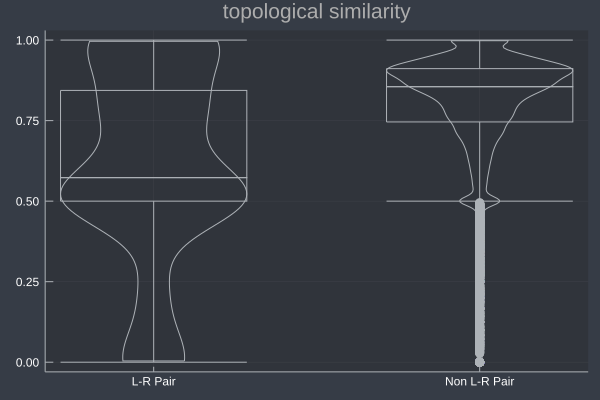

In [47]:
#plots topological similarity for L-R and non L-R pairs
plotArray = Array{Any,1}(UndefInitializer(), 2)
plotArray[1] = topSimsBetweenLR[:]
plotArray[2] = topSimsOutsideLR[:]



violin(["L-R Pair" "Non L-R Pair" ],plotArray,leg=false, color = theme(:dark), title = "topological similarity")
boxplot!(["L-R Pair" "Non L-R Pair"],plotArray,leg=false, color = theme(:dark), title = "topological similarity")

In [48]:
#do test of signifigance for difference within/out LR pairs
MannWhitneyUTest(topSimsBetweenLR, topSimsOutsideLR)

Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          -0.2823464912280702

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-8

Details:
    number of observations in each group: [92, 38689]
    Mann-Whitney-U statistic:             1.16074e6
    rank sums:                            [1.16502e6, 7.50837e8]
    adjustment for ties:                  7.953789768e9
    normal approximation (μ, σ):          (-618954.0, 107246.35228896698)


In [70]:
#store array of LR similarity that only takes in head, body, tail, pre, and post
withinHead = zeros(74)
withinBody = zeros(7)
withinTail = zeros(11)
withinPre = zeros(82)
withinPost = zeros(10)

withoutHead = zeros(16514)
withoutBody = zeros(17590)
withoutTail = zeros(4585)
withoutPre = zeros(20018)
withoutPost = zeros(18671)


withinHeadCounter = 0
withinBodyCounter = 0
withinTailCounter = 0
withinPreCounter = 0
withinPostCounter = 0

withoutHeadCounter = 0
withoutBodyCounter = 0
withoutTailCounter = 0
withoutPreCounter = 0
withoutPostCounter = 0

for i in 2:279
    for j in 1:i-1
        
        #determine if i-j is a L-R pair
        paired = false
        for k in 1:92
            if (LRindices[k,1] == i && LRindices[k,2] == j) || (LRindices[k,2] == i && LRindices[k,1] == j)
                paired = true
            end
        end
        
        if paired
            #perform the pre-post storage
            if i < 202
                withinPreCounter += 1
                withinPre[withinPreCounter] = topologicalSimilarity[i,j]
            end
            if i > 201
                 withinPostCounter += 1
                 withinPost[withinPostCounter] = topologicalSimilarity[i,j]
            end
            
            #perform region storage
            if labelsTimesPositionsType[i,3] < 0
                withinHeadCounter += 1
                withinHead[withinHeadCounter] = topologicalSimilarity[i,j]
            end
            
            if labelsTimesPositionsType[i,3] > 0 && labelsTimesPositionsType[i,3] < 0.935
                withinBodyCounter += 1
                withinBody[withinBodyCounter] = topologicalSimilarity[i,j]
            end
            
            if labelsTimesPositionsType[i,3] > 0.935
                withinTailCounter += 1
                withinTail[withinTailCounter] = topologicalSimilarity[i,j]
            end
        end
        
        if !paired
            #perform the pre-post storage
            if i < 202
                withoutPreCounter += 1
                withoutPre[withoutPreCounter] = topologicalSimilarity[i,j]
            end
            if i > 201
                 withoutPostCounter += 1
                 withoutPost[withoutPostCounter] = topologicalSimilarity[i,j]
            end
            
            #perform region storage
            if labelsTimesPositionsType[i,3] < 0
                withoutHeadCounter += 1
                withoutHead[withoutHeadCounter] = topologicalSimilarity[i,j]
            end
            
            if labelsTimesPositionsType[i,3] > 0 && labelsTimesPositionsType[i,3] < 0.935
                withoutBodyCounter += 1
                withoutBody[withoutBodyCounter] = topologicalSimilarity[i,j]
            end
            
            if labelsTimesPositionsType[i,3] > 0.935
                withoutTailCounter += 1
                withoutTail[withoutTailCounter] = topologicalSimilarity[i,j]
            end
        end
    end
end

println("output: many")

output: many


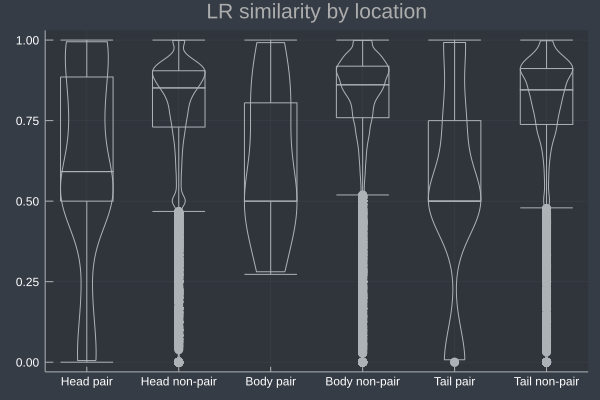

In [71]:
#plots L-R similarity parsed by location
plotArray = Array{Any,1}(UndefInitializer(), 6)
plotArray[1] = withinHead[:]
plotArray[2] = withoutHead[:]
plotArray[3] = withinBody[:]
plotArray[4] = withoutBody[:]
plotArray[5] = withinTail[:]
plotArray[6] = withoutTail[:]


violin(["Head pair" "Head non-pair" "Body pair" "Body non-pair" "Tail pair" "Tail non-pair"],plotArray,leg=false, color = theme(:dark), title = "LR similarity by location")
boxplot!(["Head pair" "Head non-pair" "Body pair" "Body non-pair" "Tail pair" "Tail non-pair"],plotArray,leg=false, color = theme(:dark), title = "LR similarity by location")

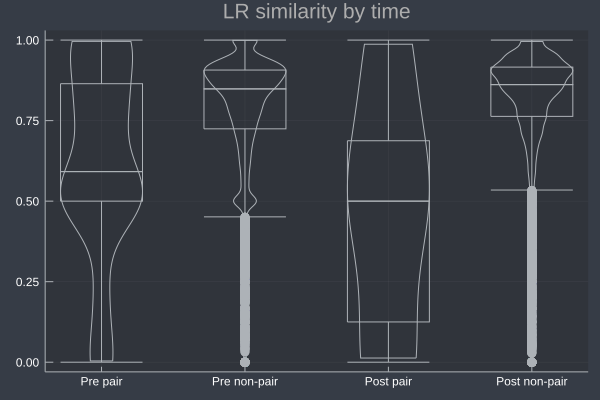

In [72]:
#plots L-R similarity parsed by time
plotArray = Array{Any,1}(UndefInitializer(), 4)
plotArray[1] = withinPre[:]
plotArray[2] = withoutPre[:]
plotArray[3] = withinPost[:]
plotArray[4] = withoutPost[:]



violin(["Pre pair" "Pre non-pair" "Post pair" "Post non-pair"],plotArray,leg=false, color = theme(:dark), title = "LR similarity by time")
boxplot!(["Pre pair" "Pre non-pair" "Post pair" "Post non-pair"],plotArray,leg=false, color = theme(:dark), title = "LR similarity by time")

In [73]:
#compute topological overlap of all LR and non-LR pairs
topologicalOverlapWithin = zeros(92)
topologicalOverlapWithout = zeros(38689)
withinCounter = 0
withoutCounter = 0

for i in 2:279
    for j in 1:i-1
        #generate and clear variables
        iNeighbors = zeros(279)
        jNeighbors = zeros(279)
        sharedNeighbors = 0
        numerator = 0
        denominator = 0
        topologicalOverlap = 0
        
        #determine the topological overlap
        for k in 1:279
            if birthSortedAdjacencyMatrix[i,k] < 300
                iNeighbors[k] = 1
            end
            if birthSortedAdjacencyMatrix[j,k] < 300
                jNeighbors[k] = 1
            end
        end
        
        for k in 1:279
            if iNeighbors[k] == 1 && jNeighbors[k] == 1
                sharedNeighbors += 1
            end
        end
        
        numerator = sharedNeighbors
        if iNeighbors[j] == 1
            numerator += 1
        end
        
        denominator = minimum([sum(iNeighbors[:]), sum(jNeighbors[:])]) + 1
        if iNeighbors[j] == 1
            denominator -= 1
        end
        
        topologicalOverlap = numerator/denominator
        
        
        #now store the topological overlap in the correct bin
        paired = false
        for k in 1:92
            if (LRindices[k,1] == i && LRindices[k,2] == j) || (LRindices[k,2] == i && LRindices[k,1] == j)
                paired = true
            end
        end
        
        if paired
            withinCounter += 1
            topologicalOverlapWithin[withinCounter] = topologicalOverlap       
        end
        
        if !paired
            withoutCounter += 1
            topologicalOverlapWithout[withoutCounter] = topologicalOverlap 
        end
    end
end

println("output: topologicalOverlapWithin and topologicalOverlapWithout")

output: topologicalOverlapWithin and topologicalOverlapWithout


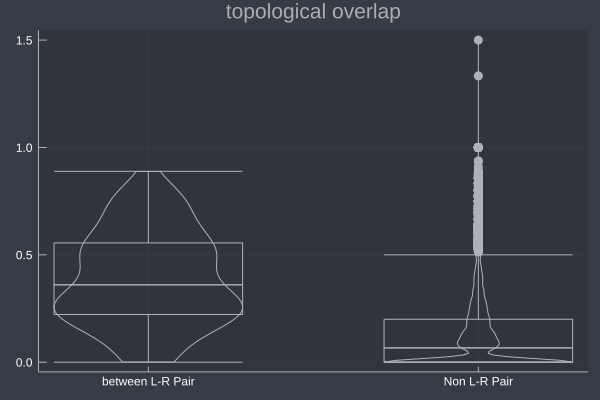

In [74]:
#plot the topological overlaps
plotArray = Array{Any,1}(UndefInitializer(), 2)
plotArray[1] = topologicalOverlapWithin[:]
plotArray[2] = topologicalOverlapWithout[:]



violin(["between L-R Pair" "Non L-R Pair" ],plotArray,leg=false, color = theme(:dark), title = "topological overlap")
boxplot!(["between L-R Pair" "Non L-R Pair"],plotArray,leg=false, color = theme(:dark), title = "topological overlap")

In [75]:
#do test of signifigance for difference within/out LR pairs
MannWhitneyUTest(topologicalOverlapWithin, topologicalOverlapWithout)

Approximate Mann-Whitney U test
-------------------------------
Population details:
    parameter of interest:   Location parameter (pseudomedian)
    value under h_0:         0
    point estimate:          0.2937229437229437

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           <1e-32

Details:
    number of observations in each group: [92, 38689]
    Mann-Whitney-U statistic:             3.00818e6
    rank sums:                            [3.01246e6, 7.4899e8]
    adjustment for ties:                  5.737446873228e12
    normal approximation (μ, σ):          (1.228486e6, 101841.87244009307)


In [76]:
#store matrix of topopogical similarity vs distance
#column 2 is distance, column 1 is similarity
pairsWithTopSimandDistance = zeros(38781,2)
counter = 1

for i in 2:279
    for j in 1:i-1
        pairsWithTopSimandDistance[counter,2] = sqrt( (labelsTimesPositionsType[i,3] - labelsTimesPositionsType[j,3])^2 + (labelsTimesPositionsType[i,4] - labelsTimesPositionsType[j,4])^2 )
        pairsWithTopSimandDistance[counter,1] = topologicalSimilarity[i,j]
        counter += 1
    end
end

#sorts the matrix by distance
for i in 1:38781
    movement = 0
    
    while i - movement > 1 && pairsWithTopSimandDistance[i - movement, 2] < pairsWithTopSimandDistance[i-movement - 1, 2]
        shadowCache = pairsWithTopSimandDistance[i - movement, :]
        pairsWithTopSimandDistance[i - movement, :] = pairsWithTopSimandDistance[i - movement - 1, :]
        pairsWithTopSimandDistance[i - movement - 1, :] = shadowCache
        
        movement += 1
    end
end
println("output: pairsWithTopSimandDistance")

output: pairsWithTopSimandDistance


In [77]:
#compute correlation between distance and topological similarity
cor(pairsWithTopSimandDistance[:,1], pairsWithTopSimandDistance[:,2])

0.05707527166667938

In [119]:
#try to categorize unfriendly nodes by adjacent location on matrix deltas
topologicalSimilarityDeltas  = zeros(279,276) #nnodes x ndeltas size
reductThisIntoThat = zeros(279,278)

#iterates over the nodes
for i in 1:279
    adjustment = 0
    
    #iterate over all pairs of nodes including i
    for j in 1:278
           
        #to avoid having to 'switch directions,' take the max of the symmetric pair
        first = maximum([topologicalSimilarity[i,j], topologicalSimilarity[j,i]])
        second = maximum([topologicalSimilarity[i,j+1], topologicalSimilarity[j+1,i]])
        delta = abs(first - second)
        reductThisIntoThat[i,j] = delta
        
    end
end

#remove deltas in which (i,i) contributed
for i in 2:278
    counter = 0
    
    for j in 1:278
        if j < i - 1
            counter += 1
            topologicalSimilarityDeltas[i,counter] = reductThisIntoThat[i,j]
        end
        
        if j > i 
            counter += 1
            topologicalSimilarityDeltas[i,counter] = reductThisIntoThat[i,j]
        end
        
    end
end

#the above construction is problematic for nodes 1 and 279, so we store them in a separate matrix
for k in 1:276
    topologicalSimilarityDeltas[1,k] = reductThisIntoThat[1,k+1]
    topologicalSimilarityDeltas[279,k] = reductThisIntoThat[279,k]
end


println("output: topologicalSimilarityDeltas and deltasForExtrema")

output: topologicalSimilarityDeltas and deltasForExtrema


In [120]:
#compute variance and mean for each node's set of deltas
nodeDeltaMeanAndVaraince = zeros(279,2)

for i in 1:279
    nodeDeltaMeanAndVaraince[i,1] = mean(topologicalSimilarityDeltas[i,:])
    nodeDeltaMeanAndVaraince[i,2] = var(topologicalSimilarityDeltas[i,:])
end

println("output: nodeDeltaMeanAndVaraince")

output: nodeDeltaMeanAndVaraince


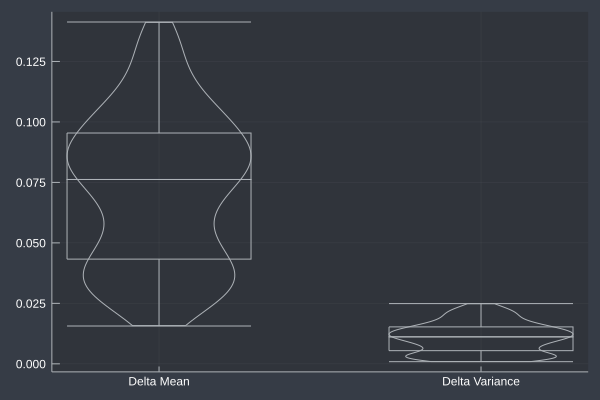

In [121]:
#plots delta mean and delta varaince
plotArray = Array{Any,1}(UndefInitializer(), 2)
plotArray[1] = nodeDeltaMeanAndVaraince[:,1]
plotArray[2] = nodeDeltaMeanAndVaraince[:,2]



violin(["Delta Mean" "Delta Variance" ],plotArray,leg=false, color = theme(:dark))
boxplot!(["Delta Mean" "Delta Variance"],plotArray,leg=false, color = theme(:dark))


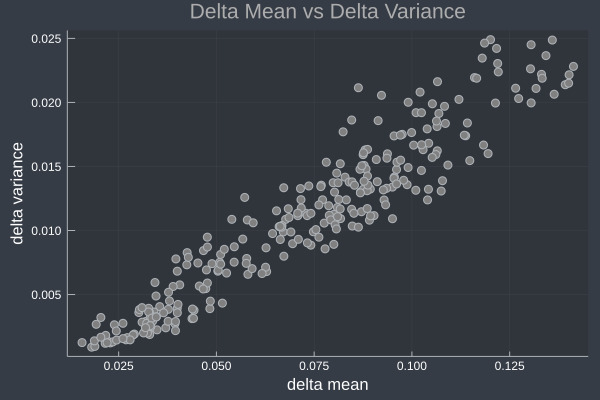

In [123]:
#plot distance/similarity pairs
scatter(nodeDeltaMeanAndVaraince[:,1], nodeDeltaMeanAndVaraince[:,2], legend = false, title = "Delta Mean vs Delta Variance", xlabel = "delta mean", ylabel = "delta variance", color = :grey)

In [124]:
#compute correlation between distance and topological similarity
cor(nodeDeltaMeanAndVaraince[:,1], nodeDeltaMeanAndVaraince[:,2])

0.9502808537880172

In [135]:
newTopSim = topologicalSimilarity[:,:]
newDeltaMean = nodeDeltaMeanAndVaraince[:,2]

for i in 1:279
    movement = 0
    
    while i - movement > 1 && newDeltaMean[i - movement] < newDeltaMean[i-movement - 1]
        shadowCache = newDeltaMean[i - movement]
        newDeltaMean[i - movement] = newDeltaMean[i - movement - 1]
        newDeltaMean[i - movement - 1] = shadowCache
        
        shadowCache = newTopSim[i - movement, :]
        newTopSim[i - movement, :] = newTopSim[i - movement - 1, :]
        newTopSim[i - movement - 1, :] = shadowCache
        
        shadowCache = newTopSim[:, i - movement]
        newTopSim[:, i - movement] = newTopSim[:, i - movement - 1]
        newTopSim[:, i - movement - 1] = shadowCache
        
        movement += 1
    end
end

for i in 2:279
    for j in 1:i-1
        if newTopSim[j,i] > 0
            newTopSim[i,j] = newTopSim[j,i]
            newTopSim[j,i] = 0
        end
    end
end

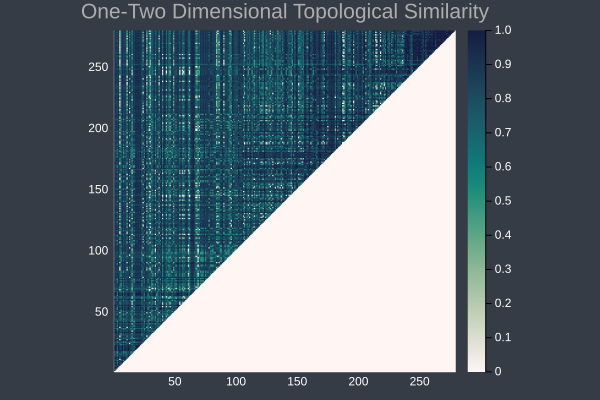

In [136]:
#plots topological similarity
heatmap(newTopSim, yflip = false, aspect_ratio=:equal, title = "One-Two Dimensional Topological Similarity", color = :tempo)

In [137]:
newDeltaMean

279-element Array{Float64,1}:
 0.000889055358204117 
 0.0009501076759554799
 0.00119533772737733  
 0.0012255376672023889
 0.001232671821359849 
 0.0012470076642570771
 0.0012994586685286128
 0.0013852543955416704
 0.0014279742693983758
 0.0014440138271973827
 0.0014617496165224033
 0.0014641069755710722
 0.001558199655357023 
 ⋮                    
 0.022194408154866865 
 0.02238385611849974  
 0.02262573153422278  
 0.022811466663986174 
 0.023041620122994363 
 0.02346070015022327  
 0.023655653035335032 
 0.024216565613383444 
 0.02450636045356255  
 0.024633411458142677 
 0.024870631554040897 
 0.02490289527622497  

In [138]:
#do summed similarity calculations
summedSimilarity = zeros(279)

for i in 1:279
    summedSimilarity[i] = sum(topologicalSimilarity[i,:]) + sum(topologicalSimilarity[:,i])
end


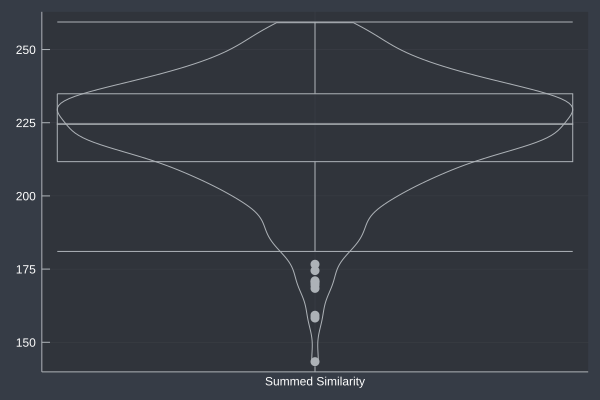

In [140]:
#plots delta mean and delta varaince
plotArray = Array{Any,1}(UndefInitializer(), 1)
plotArray[1] = summedSimilarity



violin(["Summed Similarity" ],plotArray,leg=false, color = theme(:dark))
boxplot!(["Summed Similarity"],plotArray,leg=false, color = theme(:dark))


In [141]:
newTopSim = topologicalSimilarity[:,:]
newDeltaMean = summedSimilarity[:]

for i in 1:279
    movement = 0
    
    while i - movement > 1 && newDeltaMean[i - movement] < newDeltaMean[i-movement - 1]
        shadowCache = newDeltaMean[i - movement]
        newDeltaMean[i - movement] = newDeltaMean[i - movement - 1]
        newDeltaMean[i - movement - 1] = shadowCache
        
        shadowCache = newTopSim[i - movement, :]
        newTopSim[i - movement, :] = newTopSim[i - movement - 1, :]
        newTopSim[i - movement - 1, :] = shadowCache
        
        shadowCache = newTopSim[:, i - movement]
        newTopSim[:, i - movement] = newTopSim[:, i - movement - 1]
        newTopSim[:, i - movement - 1] = shadowCache
        
        movement += 1
    end
end

for i in 2:279
    for j in 1:i-1
        if newTopSim[j,i] > 0
            newTopSim[i,j] = newTopSim[j,i]
            newTopSim[j,i] = 0
        end
    end
end

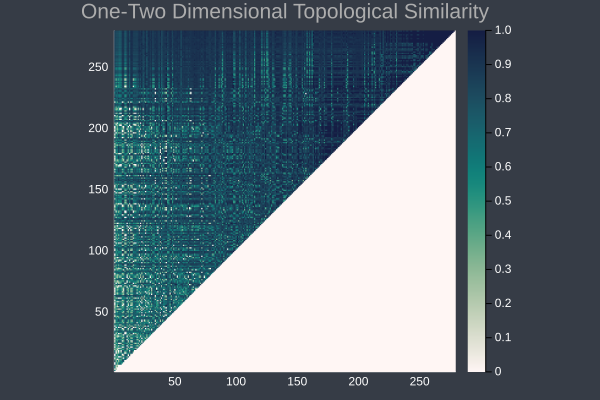

In [142]:
#plots topological similarity
heatmap(newTopSim, yflip = false, aspect_ratio=:equal, title = "One-Two Dimensional Topological Similarity", color = :tempo)